

<p align="center">
    <img src="https://github.com/GeostatsGuy/GeostatsPy/blob/master/TCG_color_logo.png?raw=true" width="220" height="240" />

</p>

## Subsurface Data Analytics 

### GenAI Minimum Acceptance Checks Static and Dynamic Model Checking of Conditioning Generative Artificial Intelligence Models for Subsurface Modeling

#### Ahmed Merzoug, PhD Student, The University of Texas at Austin
#### [LinkedIn](https://www.linkedin.com/in/ahmed-merzoug/) | [GitHub](https://github.com/amerzoug) | [GoogleScholar](https://scholar.google.com/citations?user=Ppx0Y1sAAAAJ&hl=en&oi=ao)


#### Lei Liu, PhD Student, The University of Texas at Austin
#### [LinkedIn](https://www.linkedin.com/in/leiliu96/) | [GoogleScholar](https://scholar.google.com/citations?user=N4c-pEwAAAAJ)


#### Michael Pyrcz, Associate Professor,The University of Texas at Austin
##### [Twitter](https://twitter.com/geostatsguy) | [GitHub](https://github.com/GeostatsGuy) | [Website](http://michaelpyrcz.com) | [GoogleScholar](https://scholar.google.com/citations?user=QVZ20eQAAAAJ&hl=en&oi=ao) | [Book](https://www.amazon.com/Geostatistical-Reservoir-Modeling-Michael-Pyrcz/dp/0199731446) | [YouTube](https://www.youtube.com/channel/UCLqEr-xV-ceHdXXXrTId5ig)  | [LinkedIn](https://www.linkedin.com/in/michael-pyrcz-61a648a1) | [GeostatsPy](https://github.com/GeostatsGuy/GeostatsPy)


#### Work completed as part of the DIRECT consortium for Subsurface Data Analytics and Machine Learning

#### Executive Summay

Optimal subsurface development decision-making relies on the calculation of an accurate ensemble of subsurface feature realizations that integrate all available sources of information. Generative artificial intelligence (genAI) has been proposed as a solution for building subsurface realization ensembles that may exceed geostatistical methods for conditioning not only to local measurements but also to qualitative geological concepts based on the complicated depositional, preservation, and alternation history of subsurface resource accumulations. GenAI models such as variational autoencoders, generative adversarial networks, and denoising diffusion probabilistic models have been applied, but these models are often checked by ocular inspection or limited statistics. We propose an extended genAI model checking protocol with novel metrics, diagnostics, and plots to expand current geostatistical model checking methods, known collectivity as minimum acceptance checks. This genAI model checking protocol includes checks for global univariate distribution, local and global uncertainty models, spatial continuity, local data exactitude, and local dynamic response. To demonstrate this expanded genAI model checking protocol, we design and train three diverse genAI methods on sequential Gaussian simulation realization-based training images for different variogram ranges. The results show that GANs passed all checks, DDPMs had some limitations in reproducing local uncertainty, whereas VAEs failed most of the checks. Our enhanced workflow allows for a quantitative measure of the performance of genAI models. It allows practitioners to select suitable genAI models for their subsurface modeling workflows and to have improved confidence in the development decision based on these genAI realizations. 


#### Import required libraries 

In [12]:
import numpy as np  # Importing NumPy for numerical operations
import pandas as pd  # Importing Pandas for data manipulation and analysis
import matplotlib.pyplot as plt
import geostatspy.GSLIB as GSLIB                       # GSLIB utilies, visualization and wrapper
import geostatspy.geostats as geostats                 # variogram calculations  
from scipy.interpolate import interp1d
import numpy as np
from scipy.stats import linregress
from scipy.integrate import quad
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import MDS
from sklearn.metrics import pairwise_distances
from scipy.stats import gaussian_kde
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import matplotlib.patches as mpatches
import matplotlib.ticker as ticker

import warnings
warnings.filterwarnings("ignore")

#### Define Functions

In [4]:
def min_max_normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

def calculate_overlap_percentage(data1, data2, bins=50):
    # Calculate histograms
    hist1, bins = np.histogram(data1, bins=bins, range=(np.min(data1), np.max(data1)), density=True)
    hist2, _ = np.histogram(data2, bins=bins, range=(np.min(data2), np.max(data2)), density=True)
    
    # Calculate overlap area
    overlap = np.sum(np.minimum(hist1, hist2) * np.diff(bins))
    
    # Calculate area under data1's histogram for normalization
    data1_area = np.sum(hist1 * np.diff(bins))
    
    # Normalize overlap by data1's area and convert to percentage
    overlap_percentage = (overlap / data1_area) * 100
    return overlap_percentage


# Function to load and process data based on file extension
def load_and_process(filename):
    if filename.endswith('.npz'):
        data = np.load(filename)
        images = [data[key] for key in data]
        return np.stack(images).squeeze().std(axis=0).mean(axis=0)
    else:
        return np.load(filename).squeeze().std(axis=0).mean(axis=0)
    
    
# Function to load and process data
def load_and_process_data(GenAI_path, TI_path):
    df_GenAI = pd.read_excel(GenAI_path, skiprows=2)
    df_TI = pd.read_excel(TI_path, skiprows=2)
    
    df_GenAI.columns = ['Time_Day', 'Date', 'Recovery_Factor']
    df_TI.columns = ['Time_Day', 'Date', 'Recovery_Factor']
    
    for df_temp in [df_GenAI, df_TI]:
        df_temp['Time_Day'] = pd.to_numeric(df_temp['Time_Day'], errors='coerce')
        df_temp['Recovery_Factor'] = pd.to_numeric(df_temp['Recovery_Factor'], errors='coerce')
        df_temp.dropna(inplace=True)
    
    # Custom functions for the 25th and 75th percentiles
    def percentile_25(x):
        return np.percentile(x, 25)
    
    def percentile_75(x):
        return np.percentile(x, 75)
    
    # Updated aggregation with 25th and 75th percentiles
    grouped_GenAI = df_GenAI.groupby('Time_Day')['Recovery_Factor'].agg([percentile_25, percentile_75, np.mean])
    grouped_TI = df_TI.groupby('Time_Day')['Recovery_Factor'].agg([percentile_25, percentile_75, np.mean])
    
    return grouped_GenAI, grouped_TI


# Function to calculate variograms for given data
def calculate_variograms(data):
    vario_y_all = []
    for img in data:
        nlagy, varioy, nppy = geostats.gam(
            img, tmin=-9999, tmax=9999, xsiz=10, ysiz=10,
            ixd=0, iyd=1, nlag=31, isill=1.0
        )
        vario_y_all.append(varioy)
    vario_y_all = np.array(vario_y_all)
    median_y = np.mean(vario_y_all, axis=0)
    iqr_y = np.percentile(vario_y_all, [25, 75], axis=0)
    return nlagy, median_y, iqr_y,vario_y_all


def plot_with_percentiles(ax, x, data, label, color, marker, linestyle,color2):
    mean = np.mean(data, axis=1)
    lower = np.percentile(data, 25, axis=1)
    upper = np.percentile(data, 75, axis=1)

    ax.plot(x, mean, color=color2, marker=marker, linestyle='-',linewidth=2)
    ax.fill_between(x, lower, upper, color=color, alpha=0.5, label=label)

def calculate_overlap_area(sample1, sample2):
    quantiles1 = np.percentile(sample1, np.linspace(0, 100, 100))
    quantiles2 = np.percentile(sample2, np.linspace(0, 100, 100))
    
    slopes, intercepts = [], []
    for i in range(len(quantiles1) - 1):
        slope, intercept, _, _, _ = linregress([quantiles1[i], quantiles1[i+1]], [quantiles2[i], quantiles2[i+1]])
        slopes.append(slope)
        intercepts.append(intercept)
    
    def segment_linear_fit(x, index):
        return slopes[index] * x + intercepts[index]
    
    total_absolute_area = sum(
        quad(lambda x: abs(segment_linear_fit(x, i) - x), quantiles1[i], quantiles1[i+1])[0]
        for i in range(len(slopes))
    )
    
    return total_absolute_area


#### Global Univariate Distribution


For the first static check, the global model univariate distribution is checked against the training image global distribution by using the overlap percentage between two distributions and the divergence area from the $y=x$ line of the Q-Q plot. The distribution overlap percentage is approximated by numerical integration from the consistently binned normalized histograms for both distributions. The minimum value at each bin interval is calculated and divided by the bin from the training images. The sum of the percentages of all bins reports the overlap percentage (Inman and Bradley, 1989; Merzoug and Pyrcz, 2024).

$$
C_{\text{Overlap}} = \sum_{i=1}^n \min(B_{\text{TI}_i}, B_{\text{GI}_i}) \times 100 
$$

where $(B_{\text{TI}_i})$, $(B_{\text{GI}_i})$ are the normalized histogram bins for the training image and generated image data distributions, and $(n)$ is the number of bins.

For the Q-Q plot divergence area, the data distribution percentiles of the training and genAI-generated realizations are plotted against each other. A piecewise linear regression fits the Q-Q plot experimental points, and the divergence area from the y=x line is calculated (Merzoug and Pyrcz, 2024),

$$
A_{\Delta} = \sum_{i=1}^{n-1} \frac{\left\lVert g_i^* - t_i \right\rVert + \left\lVert g_{i+1}^* - t_{i+1} \right\rVert}{2} \times (t_{i+1} - t_i) 
$$

where $(A_{\Delta})$ is the divergence area, $(n)$ is the order of the quantile. $(g_i^*)$ and $(t_i)$ are the ith quantiles for generated and training data respectively. A small divergence area indicates a good data distribution reproduction (Merzoug and Pyrcz, 2024).



In [5]:
file_numbers = [40, 60, 80, 100]
# Initialize dictionaries to hold the overlap percentages for each method
overlap_percentages = {
    'VAE': [],
    'VAECOND': [],
    'GAN': [],
    'GANCOND': [],
    'DDPM': [],
    'DDPMCOND': [],
    'CGAN': [],
    'CVAE': []
}

for num in file_numbers:
    # Filenames
    data1_filename = f'VAE GAN DDPM/Training/my_data{num}_32_32.npz'
    data1_filename_cond = f'VAE GAN DDPM/Training/my_data{num}_32_32COND.npz'
    
    filenames = {
        'VAE': f'VAE GAN DDPM/VAE/VAE{num}.npy',
        'VAECOND': f'VAE GAN DDPM/VAE/VAE{num}COND.npy',
        'GAN': f'VAE GAN DDPM/GAN/GAN{num}.npz',
        'GANCOND': f'VAE GAN DDPM/GAN/GAN{num}COND.npz',
        'DDPM': f'VAE GAN DDPM/DDPM/DDPM{num}.npy',
        'DDPMCOND': f'VAE GAN DDPM/DDPM/DDPM{num}COND.npy',
        'CGAN': f'VAE GAN DDPM/GAN/CGAN{num}.npy',
        'CVAE': f'VAE GAN DDPM/VAE/CVAE{num}.npy'
    }
    
    for method, data2_filename in filenames.items():
        # Load the data
        data1 = np.load(data1_filename_cond if 'COND' in method else data1_filename)
        images = [data1[key] for key in data1]
        combined_tensor = np.stack(images).squeeze()

        if method in ['GAN', 'GANCOND']:
            data2 = np.load(data2_filename)
            data2 = [data2[key] for key in data2]
            data2 = np.stack(data2).squeeze()
        else:
            data2 = np.load(data2_filename).squeeze()

        # Standardize and normalize data2 if required
        if method in ['DDPM', 'DDPMCOND', 'CGAN', 'CVAE']:
            data2 = (data2 - data2.mean()) / data2.std() * combined_tensor.std() + combined_tensor.mean()

        # Normalize the datasets
        sample1 = min_max_normalize(combined_tensor)
        sample2 = min_max_normalize(data2)

        # Flatten the combined tensor from data1
        sample1_flattened = sample1.flatten()

        # Initialize a list to hold overlap percentages for the current num
        current_overlaps = []

        for img in sample2:
            # Flatten the image
            sample2_flattened = img.flatten()

            # Calculate the overlap percentage and append it to the current list
            overlap_pct = calculate_overlap_percentage(sample1_flattened, sample2_flattened)
            current_overlaps.append(overlap_pct)

        # Append the current overlaps to the main list
        overlap_percentages[method].append(current_overlaps)

# After this loop, `overlap_percentages` will contain all the percentages for each method


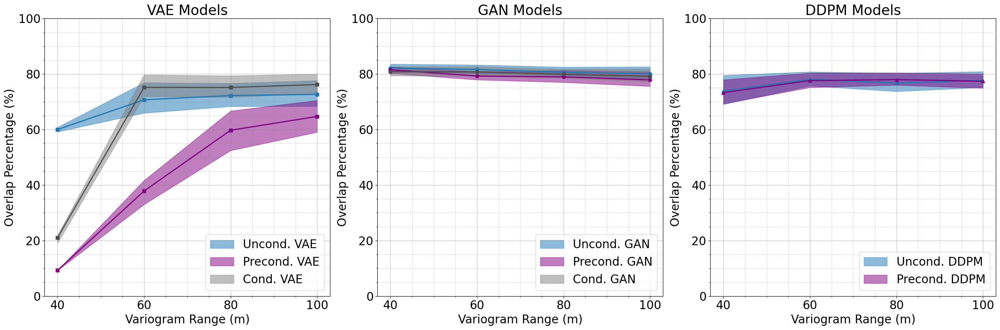

In [7]:
# Sample data (placeholders)
x_axis = [40, 60, 80, 100]

# Creating subplots
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

# Subplot 1: VAE Models
plot_with_percentiles(axs[0], x_axis, overlap_percentages['VAE'], 'Uncond. VAE', 'C0', 's', '--','C0')
plot_with_percentiles(axs[0], x_axis, overlap_percentages['VAECOND'], 'Precond. VAE', 'purple', 's', '--','purple')
plot_with_percentiles(axs[0], x_axis, overlap_percentages['CVAE'], 'Cond. VAE', 'grey', 's', '--','#4D4D4D')

axs[0].set_title('VAE Models', fontsize=24)
axs[0].set_xlabel('Variogram Range (m)', fontsize=20)
axs[0].set_ylabel('Overlap Percentage (%)', fontsize=20)
axs[0].tick_params(axis='both', which='major', labelsize=20)
axs[0].set_ylim([0, 100])
axs[0].legend(fontsize=20, loc='lower right')
axs[0].set_xticks(x_axis)  # Set x-ticks to only 40, 60, 80, 100
axs[0].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[0].minorticks_on()
axs[0].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

# Subplot 2: GAN Models
plot_with_percentiles(axs[1], x_axis, overlap_percentages['GAN'], 'Uncond. GAN', 'C0', 'o', '-','C0')
plot_with_percentiles(axs[1], x_axis, overlap_percentages['GANCOND'], 'Precond. GAN', 'purple', 'o', '-','purple')
plot_with_percentiles(axs[1], x_axis, overlap_percentages['CGAN'], 'Cond. GAN', 'grey', 'o', '-','#4D4D4D')

axs[1].set_title('GAN Models', fontsize=24)
axs[1].set_xlabel('Variogram Range (m)', fontsize=20)
axs[1].set_ylabel('Overlap Percentage (%)', fontsize=20)
axs[1].tick_params(axis='both', which='major', labelsize=20)
axs[1].set_ylim([0, 100])
axs[1].legend(fontsize=20, loc='lower right')
axs[1].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[1].set_xticks(x_axis)  # Set x-ticks to only 40, 60, 80, 100
axs[1].minorticks_on()
axs[1].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

# Subplot 3: DDPM Models
plot_with_percentiles(axs[2], x_axis, overlap_percentages['DDPM'], 'Uncond. DDPM', 'C0', '^', '-.','C0')
plot_with_percentiles(axs[2], x_axis, overlap_percentages['DDPMCOND'], 'Precond. DDPM', 'purple', '^', '-.', 'purple')

axs[2].set_title('DDPM Models', fontsize=24)
axs[2].set_xlabel('Variogram Range (m)', fontsize=20)
axs[2].set_ylabel('Overlap Percentage (%)', fontsize=20)
axs[2].tick_params(axis='both', which='major', labelsize=20)
axs[2].set_ylim([0, 100])
axs[2].legend(fontsize=20, loc='lower right')
axs[2].set_xticks(x_axis)  # Set x-ticks to only 40, 60, 80, 100
axs[2].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[2].minorticks_on()
axs[2].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

plt.tight_layout()
plt.show()


In [10]:
file_numbers = [40, 60, 80, 100]
# Initialize dictionaries to hold the overlap percentages for each method
overlap_areas = {
    'VAE': [],
    'VAECOND': [],
    'GAN': [],
    'GANCOND': [],
    'DDPM': [],
    'DDPMCOND': [],
    'CGAN': [],
    'CVAE': []
}

for num in file_numbers:
    # Filenames
    data1_filename = f'VAE GAN DDPM/Training/my_data{num}_32_32.npz'
    data1_filename_cond = f'VAE GAN DDPM/Training/my_data{num}_32_32COND.npz'
    
    filenames = {
        'VAE': f'VAE GAN DDPM/VAE/VAE{num}.npy',
        'VAECOND': f'VAE GAN DDPM/VAE/VAE{num}COND.npy',
        'GAN': f'VAE GAN DDPM/GAN/GAN{num}.npz',
        'GANCOND': f'VAE GAN DDPM/GAN/GAN{num}COND.npz',
        'DDPM': f'VAE GAN DDPM/DDPM/DDPM{num}.npy',
        'DDPMCOND': f'VAE GAN DDPM/DDPM/DDPM{num}COND.npy',
        'CGAN': f'VAE GAN DDPM/GAN/CGAN{num}.npy',
        'CVAE': f'VAE GAN DDPM/VAE/CVAE{num}.npy'
    }
    
    for method, data2_filename in filenames.items():
        # Load the data
        data1 = np.load(data1_filename_cond if 'COND' in method else data1_filename)
        images = [data1[key] for key in data1]
        combined_tensor = np.stack(images).squeeze()[:100]

        if method in ['GAN', 'GANCOND']:
            data2 = np.load(data2_filename)
            data2 = [data2[key] for key in data2]
            data2 = np.stack(data2).squeeze()[:100]
        else:
            data2 = np.load(data2_filename).squeeze()[:100]

        # Standardize and normalize data2 if required
        if method in ['DDPM', 'DDPMCOND', 'CGAN', 'CVAE']:
            data2 = (data2 - data2.mean()) / data2.std() * combined_tensor.std() + combined_tensor.mean()

        # Normalize the datasets
        sample1 = min_max_normalize(combined_tensor)
        sample2 = min_max_normalize(data2)

        # Flatten the combined tensor from data1
        sample1_flattened = sample1.flatten()

        # Initialize a list to hold overlap percentages for the current num
        current_areas = []

        for img in sample2:
            # Flatten the image
            sample2_flattened = img.flatten()

            # Calculate the overlap percentage and append it to the current list
            area = calculate_overlap_area(sample1.flatten(), sample2_flattened)
            current_areas.append(area)

        # Append the current overlaps to the main list
        overlap_areas[method].append(current_areas)

# After this loop, `overlap_percentages` will contain all the percentages for each method


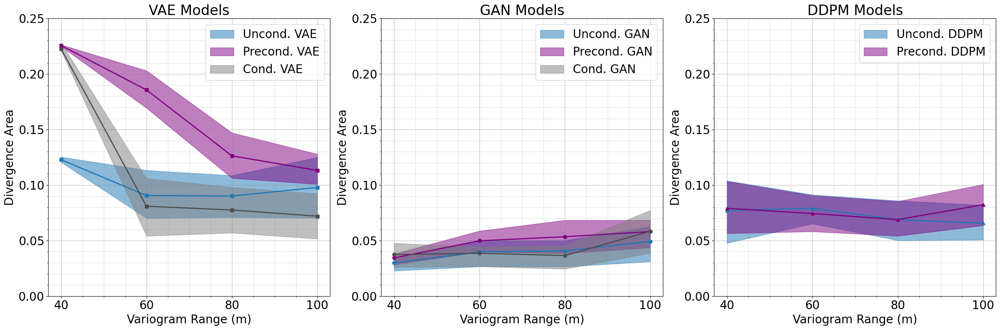

In [11]:

# Sample data (placeholders)
x_axis = [40, 60, 80, 100]


# Creating subplots
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

# Subplot 1: VAE Models
plot_with_percentiles(axs[0], x_axis, overlap_areas['VAE'], 'Uncond. VAE', 'C0', 's', '--', 'C0')
plot_with_percentiles(axs[0], x_axis, overlap_areas['VAECOND'], 'Precond. VAE', 'purple', 's', '--', 'purple')
plot_with_percentiles(axs[0], x_axis, overlap_areas['CVAE'], 'Cond. VAE', 'grey', 's', '--', '#4D4D4D')

axs[0].set_title('VAE Models', fontsize=24)
axs[0].set_xlabel('Variogram Range (m)', fontsize=20)
axs[0].set_ylabel('Divergence Area', fontsize=20)
axs[0].tick_params(axis='both', which='major', labelsize=20)
axs[0].set_ylim([0, 0.25])
axs[0].legend(fontsize=20, loc='upper right')
axs[0].set_xticks(x_axis)  # Set x-ticks to only 40, 60, 80, 100
axs[0].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[0].minorticks_on()
axs[0].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

# Subplot 2: GAN Models
plot_with_percentiles(axs[1], x_axis, overlap_areas['GAN'], 'Uncond. GAN', 'C0', 'o', '-', 'C0')
plot_with_percentiles(axs[1], x_axis, overlap_areas['GANCOND'], 'Precond. GAN', 'purple', 'o', '-', 'purple')
plot_with_percentiles(axs[1], x_axis, overlap_areas['CGAN'], 'Cond. GAN', 'grey', 'o', '-', '#4D4D4D')

axs[1].set_title('GAN Models', fontsize=24)
axs[1].set_xlabel('Variogram Range (m)', fontsize=20)
axs[1].set_ylabel('Divergence Area', fontsize=20)
axs[1].tick_params(axis='both', which='major', labelsize=20)
axs[1].set_ylim([0, 0.25])
axs[1].legend(fontsize=20, loc='upper right')
axs[1].set_xticks(x_axis)  # Set x-ticks to only 40, 60, 80, 100
axs[1].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[1].minorticks_on()
axs[1].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

# Subplot 3: DDPM Models
plot_with_percentiles(axs[2], x_axis,overlap_areas['DDPM'], 'Uncond. DDPM', 'C0', '^', '-.', 'C0')
plot_with_percentiles(axs[2], x_axis, overlap_areas['DDPMCOND'], 'Precond. DDPM', 'purple', '^', '-.', 'purple')

axs[2].set_title('DDPM Models', fontsize=24)
axs[2].set_xlabel('Variogram Range (m)', fontsize=20)
axs[2].set_ylabel('Divergence Area', fontsize=20)
axs[2].tick_params(axis='both', which='major', labelsize=20)
axs[2].set_ylim([0, 0.25])
axs[2].legend(fontsize=20, loc='upper right')
axs[2].set_xticks(x_axis)  # Set x-ticks to only 40, 60, 80, 100
axs[2].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[2].minorticks_on()
axs[2].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

plt.tight_layout()
plt.show()

#### Local Uncertainty Check



The local uncertainty model is checked using the expected value of the by-pixel standard deviation of a large number of subsurface realizations for training images and genAI-generated images.

$$
\sigma_u = E_{\alpha \in \text{VOI}} \left\{ \frac{1}{L} \sum_{l=1}^{L} \left( I_l (u_\alpha) - \mu(u_\alpha) \right)^2 \right\}
$$

where $( L )$ is the number of realizations, $( I_l(u_\alpha) )$ is the image value at location vector $( u_\alpha )$, and $( \mu(u_\alpha) )$ is the by-pixel average value at location vector $( u_\alpha )$, with $( \alpha )$ taken over all the volume of interest (VOI). The closer $( \sigma_u )$ of genAI models is to $( \sigma_u )$ of the SGSIM-based Training Images, the better local uncertainty is reproduced.


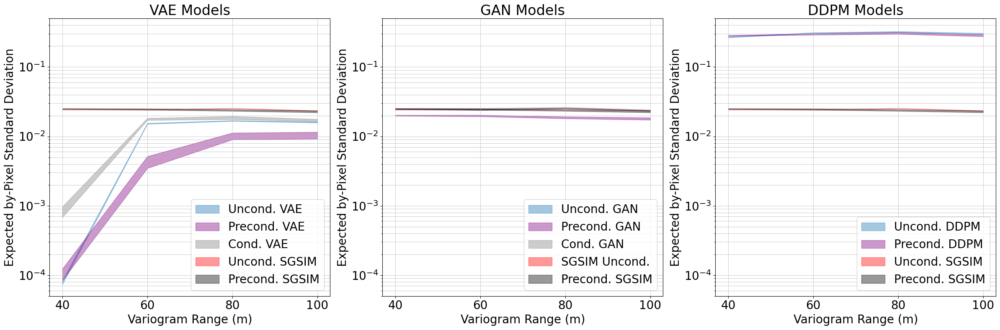

In [42]:
import numpy as np
x_axis = [40, 60, 80, 100]
# Initialize lists to hold the standard deviation values
STANDDevGAN, STANDDevCGAN, STANDDevGANCOND, STANDDevDDPMCOND, STANDDevDDPM, STANDDevVAE, STANDDevCVAE, STANDDevVACOND, STANDDevSGSIM, STANDDevSGSIMCOND = [], [], [], [], [], [], [], [], [], []

# Define the base paths for each model type
base_paths = {
    'GAN': 'VAE GAN DDPM/GAN/',
    'VAE': 'VAE GAN DDPM/VAE/',
    'DDPM': 'VAE GAN DDPM/DDPM/',
    'SGSIM': 'VAE GAN DDPM/Training/'
}

# Define the file types and corresponding paths
file_mappings = {
    'GAN': 'GAN{}.npz',
    'CGAN': 'CGAN{}.npy',
    'GANCOND': 'GAN{}COND.npz',
    'VAE': 'VAE{}.npy',
    'VACOND': 'VAE{}COND.npy',
    'CVAE': 'CVAE{}.npy',
    'DDPMCOND': 'DDPM{}COND.npy',
    'DDPM': 'DDPM{}.npy',
    'SGSIMCOND': 'my_data{}_32_32COND.npz',
    'SGSIM': 'my_data{}_32_32.npz'
}

# Loop over the different numbers
file_numbers = [40, 60, 80, 100]
for num in file_numbers:
    # Load and process each data file
    STANDDevGAN.append(load_and_process(base_paths['GAN'] + file_mappings['GAN'].format(num)))
    STANDDevCGAN.append(load_and_process(base_paths['GAN'] + file_mappings['CGAN'].format(num)))
    STANDDevGANCOND.append(load_and_process(base_paths['GAN'] + file_mappings['GANCOND'].format(num)))
    STANDDevVAE.append(load_and_process(base_paths['VAE'] + file_mappings['VAE'].format(num)))
    STANDDevVACOND.append(load_and_process(base_paths['VAE'] + file_mappings['VACOND'].format(num)))
    STANDDevCVAE.append(load_and_process(base_paths['VAE'] + file_mappings['CVAE'].format(num)))
    STANDDevDDPMCOND.append(load_and_process(base_paths['DDPM'] + file_mappings['DDPMCOND'].format(num)))
    STANDDevDDPM.append(load_and_process(base_paths['DDPM'] + file_mappings['DDPM'].format(num)))
    STANDDevSGSIM.append(load_and_process(base_paths['SGSIM'] + file_mappings['SGSIM'].format(num)))
    STANDDevSGSIMCOND.append(load_and_process(base_paths['SGSIM'] + file_mappings['SGSIMCOND'].format(num)))


fig, axs = plt.subplots(1, 3, figsize=(24, 8))

# Determining unified data limits
y_min, y_max = 0.00005, 0.5  # Example limits for the log scale based on the provided data range
x_ticks = [40, 60, 80, 100]
# Re-plotting with uniform y-axis limits
for ax in axs:
    ax.set_ylim(y_min, y_max)
    ax.set_yscale('log')
    ax.set_xticks(x_ticks)
    ax.set_xlabel('Variogram Range (m)', fontsize=20)
    ax.set_ylabel('Expected by-Pixel Standard Deviation', fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=20)
    ax.grid(True, which="both", ls="-", alpha=0.6)

# VAE models
axs[0].fill_between(x_axis, np.percentile(STANDDevVAE,25,axis = 1), np.percentile(STANDDevVAE,75,axis = 1), color='C0', alpha=0.4, label='Uncond. VAE')
axs[0].fill_between(x_axis, np.percentile(STANDDevVACOND,25,axis = 1), np.percentile(STANDDevVACOND,75,axis = 1), color='purple', alpha=0.4, label='Precond. VAE')
axs[0].fill_between(x_axis, np.percentile(STANDDevCVAE,25,axis = 1), np.percentile(STANDDevCVAE,75,axis = 1), color='grey', alpha=0.4, label='Cond. VAE')
axs[0].fill_between(x_axis, np.percentile(STANDDevSGSIM,25,axis = 1), np.percentile(STANDDevSGSIM,75,axis = 1), color='red', alpha=0.4, label='Uncond. SGSIM')
axs[0].fill_between(x_axis, np.percentile(STANDDevSGSIMCOND,25,axis = 1), np.percentile(STANDDevSGSIMCOND,75,axis = 1), color='black', alpha=0.4, label='Precond. SGSIM')
axs[0].set_title('VAE Models', fontsize=24)
axs[0].legend(fontsize=20,loc = 'lower right')

# GAN models
axs[1].fill_between(x_axis, np.percentile(STANDDevGAN,25,axis = 1), np.percentile(STANDDevGAN,75,axis = 1), color='C0', alpha=0.4, label='Uncond. GAN')
axs[1].fill_between(x_axis, np.percentile(STANDDevGANCOND,25,axis = 1), np.percentile(STANDDevGANCOND,75,axis = 1), color='purple', alpha=0.4, label='Precond. GAN')
axs[1].fill_between(x_axis, np.percentile(STANDDevCGAN,25,axis = 1), np.percentile(STANDDevCGAN,75,axis = 1), color='grey', alpha=0.4, label='Cond. GAN')
axs[1].fill_between(x_axis, np.percentile(STANDDevSGSIM,25,axis = 1), np.percentile(STANDDevSGSIM,75,axis = 1), color='red', alpha=0.4, label='SGSIM Uncond.')
axs[1].fill_between(x_axis, np.percentile(STANDDevSGSIMCOND,25,axis = 1), np.percentile(STANDDevSGSIMCOND,75,axis = 1), color='black', alpha=0.4, label='Precond. SGSIM')
axs[1].set_title('GAN Models', fontsize=24)
axs[1].legend(fontsize=20,loc = 'lower right')

# DDPM models
axs[2].fill_between(x_axis, np.percentile(STANDDevDDPM,25,axis = 1), np.percentile(STANDDevDDPM,75,axis = 1), color='C0', alpha=0.4, label='Uncond. DDPM')
axs[2].fill_between(x_axis, np.percentile(STANDDevDDPMCOND,25,axis = 1), np.percentile(STANDDevDDPMCOND,75,axis = 1), color='purple', alpha=0.4, label='Precond. DDPM')
axs[2].fill_between(x_axis, np.percentile(STANDDevSGSIM,25,axis = 1), np.percentile(STANDDevSGSIM,75,axis = 1), color='red', alpha=0.4, label='Uncond. SGSIM')
axs[2].fill_between(x_axis, np.percentile(STANDDevSGSIMCOND,25,axis = 1), np.percentile(STANDDevSGSIMCOND,75,axis = 1), color='black', alpha=0.4, label='Precond. SGSIM')
axs[2].set_title('DDPM Models', fontsize=24)
axs[2].legend(fontsize=20, loc = 'lower right')

plt.tight_layout()
plt.show()


#### Global Uncertainty Check


The training images and genAI models are projected to and compared in a low-dimensional space using Multidimensional Scaling (MDS) to overcome the curse of dimensionality. The training and genAI-generated images are flattened, and then the pairwise by-pixel Euclidean distance is calculated using the $( L_2 )$ norm. MDS reduces the dimensionality of images while preserving the relative pairwise distances; therefore, image representations in low-dimensional MDS space may be plotted with their corresponding label on a scatter plot for comparison and grouping (Borg and Groenen, 1997; Merzoug and Pyrcz, 2024).

Visual inspection of the scatter plot shows the degree of similarity between images and the variety of images. While visual inspection is a qualitative approach, we propose a new quantitative approach for MDS scatter plot interpretation. 

1. **Grid Creation**: First, we build a grid for the scatter plot.
2. **KDE Fitting**: Second, we fit one kernel density estimator (KDE) to the training images and another one for genAI-generated images.
3. **Overlap Calculation**: Then, we calculate the minimum value of both KDEs for each grid and divide it by the KDE estimation of the training images.
4. **Summation**: Finally, we sum the overlap across all grids and report the total overlap percentage, similar to the previously discussed histogram overlap, now applied to a 2D histogram in MDS space $( C_{\text{MDS,Overlap}} )$.

This method quantitatively measures the similarity between the distribution of the training images and the genAI-generated images in the reduced-dimensionality MDS space.


$$
C_{\text{MDS,Overlap}} = \frac{\sum_{\alpha \in \text{VOI}} \min\left(\text{KDE}_{\text{TI}}(u_\alpha), \text{KDE}_{\text{GI}}(u_\alpha)\right)}{\sum_{\alpha \in \text{VOI}} \text{KDE}_{\text{TI}}(u_\alpha)} \times 100 
$$

where $ \text{KDE}_{\text{TI}}(u_\alpha) $ and $ \text{KDE}_{\text{GI}}(u_\alpha) $ are the densities of the training images and genAI-generated realizations at location vector $ u_\alpha $, with $ \alpha $ taken over all the volume of interest (VOI). The closer $ C_{\text{MDS,Overlap}} $ is to 100%, the better the global uncertainty is reproduced.


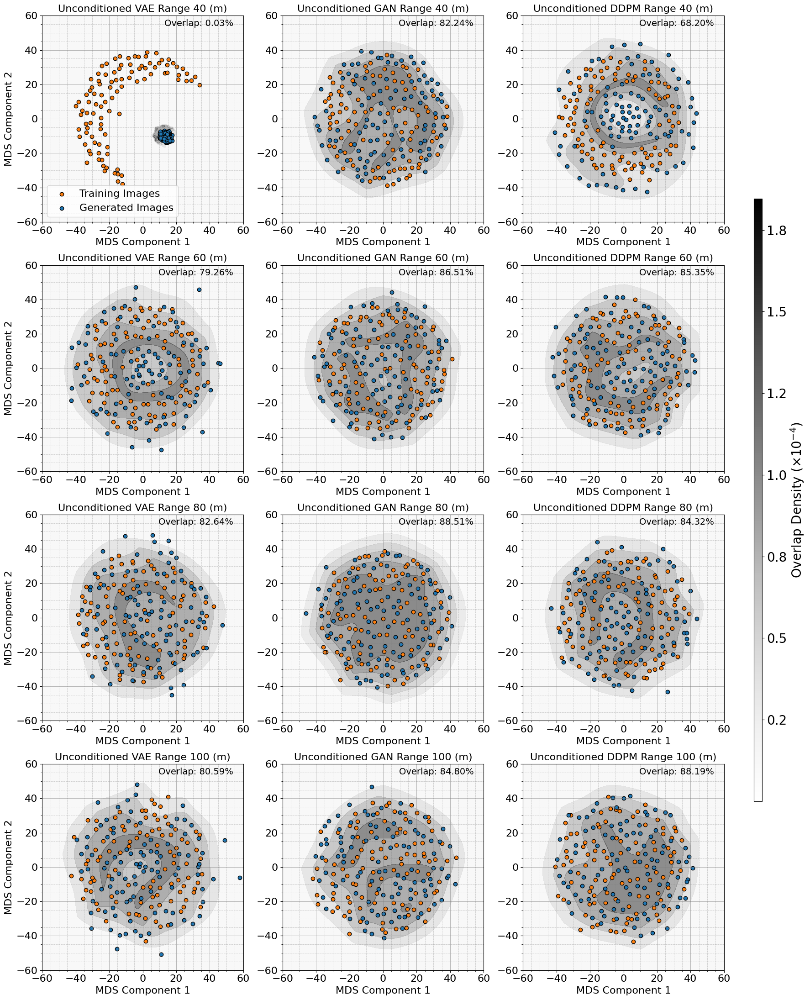

In [50]:

# Dataset identifiers
dataset_numbers = [40, 60, 80, 100]

# Set up for a 4x3 grid plotting
fig, axs = plt.subplots(4, 3, figsize=(18, 22))  # Adjust the figure size as needed
axs = axs.ravel()
VAEMDS, GANMDS, DDPMMDS = [], [], []
# Initialize the scaler
scaler = StandardScaler()

# Load, standardize, compute MDS and plot data for each method
for row, num in enumerate(dataset_numbers):
    for col, method in enumerate(['VAE', 'GAN', 'DDPM']):
        index = row * 3 + col  # Determine the subplot index
        ax = axs[index]

        # Load "real" training data
        real_data_path = f'VAE GAN DDPM/Training/my_data{num}_32_32.npz'
        real_data = np.load(real_data_path)
        real_images = [real_data[key] for key in real_data]
        real_data_flat = np.stack(real_images).squeeze()[:100].reshape(-1, 32*32)
        sca = real_data_flat
        real_data_flat = scaler.fit_transform(real_data_flat)  # Standardize "real" data

        # Load generated data
        gen_data_path = f'VAE GAN DDPM/{method}/{method}{num}.npy' if method == 'VAE' or method == 'DDPM' else f'VAE GAN DDPM/{method}/{method}{num}.npz'
        
        # Check file format to load accordingly
        if gen_data_path.endswith('.npy'):
            gen_data = np.load(gen_data_path).squeeze()
        else:  # It's a .npz file
            gen_data_dict = np.load(gen_data_path)
            gen_data = np.stack([gen_data_dict[key] for key in gen_data_dict]).squeeze()
        
        gen_data = gen_data[:100]
        gen_data_flat = gen_data.reshape(-1, 32*32)

        if method == 'DDPM' or method == 'VAE' or method == 'GAN':
            gen_data_flat = (gen_data_flat - gen_data_flat.flatten().mean()) / gen_data_flat.flatten().std() * sca.flatten().std() + sca.flatten().mean()
        gen_data_flat = scaler.transform(gen_data_flat)  # Standardize generated data with scaler fitted on real data

        combined_data = np.vstack((real_data_flat, gen_data_flat))

        # Combine the new data and generated data
        # Compute the dissimilarity (distance) matrix and perform MDS
        dissimilarity_matrix = pairwise_distances(combined_data, metric='euclidean')
        mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
        mds_transformed_data = mds.fit_transform(dissimilarity_matrix)
        
        # Calculate the overlap
        data1 = mds_transformed_data[:real_data_flat.shape[0], :]
        data2 = mds_transformed_data[real_data_flat.shape[0]:, :]
        kde1 = gaussian_kde(data1.T)
        kde2 = gaussian_kde(data2.T)
        
        # Define a grid over which to evaluate the densities
        global_min_x, global_max_x = -60, 60
        global_min_y, global_max_y = -60, 60
        grid_x, grid_y = np.mgrid[global_min_x:global_max_x:100j, global_min_y:global_max_y:100j]
        positions = np.vstack([grid_x.ravel(), grid_y.ravel()])
        density1 = kde1(positions).reshape(grid_x.shape)
        density2 = kde2(positions).reshape(grid_x.shape)
        overlap_density = np.minimum(density1, density2)

        # Update norm to new overlap_density min and max
        norm = mcolors.Normalize(vmin=None, vmax=None)
        norm.vmin = min(norm.vmin, overlap_density.min()) if norm.vmin is not None else overlap_density.min()
        norm.vmax = max(norm.vmax, overlap_density.max()) if norm.vmax is not None else overlap_density.max()

        # Create a ScalarMappable with the colormap and norm
        sm = cm.ScalarMappable(cmap='Greys', norm=norm)
        sm.set_array([])

        # Plotting
        ax.contourf(grid_x, grid_y, overlap_density, levels=5, cmap='Greys', alpha=0.5, zorder=1)
        ax.scatter(mds_transformed_data[:real_data_flat.shape[0], 0], mds_transformed_data[:real_data_flat.shape[0], 1], c='C1', label='Training Images', alpha=1, edgecolors='k')
        ax.scatter(mds_transformed_data[real_data_flat.shape[0]:, 0], mds_transformed_data[real_data_flat.shape[0]:, 1], c='C0', label=f'Generated Images', alpha=1, edgecolors='k')

        ax.set_title(f'Unconditioned {method} Range {num} (m)', fontsize=16)
        ax.set_xlabel('MDS Component 1', fontsize=16)
        if col == 0:
            ax.set_ylabel('MDS Component 2', fontsize=16)
        ax.tick_params(axis='both', which='major', labelsize=16)
        ax.set_xlim(global_min_x, global_max_x)
        ax.set_ylim(global_min_y, global_max_y)

        # Calculate and display overlap percentage
        overlap = np.sum(np.minimum(density1, density2))
        overlap_percentage = overlap / np.sum(density1) * 100
        ax.text(0.95, 0.95, f'Overlap: {overlap_percentage:.2f}%', transform=ax.transAxes, fontsize=14, ha='right')
        ax.grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
        if method == 'GAN':

            GANMDS.append(overlap_percentage)

        if method == 'VAE':

            VAEMDS.append(overlap_percentage)


        if method == 'DDPM':

            DDPMMDS.append(overlap_percentage)
        # Enable the minor ticks
        ax.minorticks_on()

        # Modify the existing major grid settings if needed, or keep it as is
        ax.grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)
        # Set the legend on the top left plot
        if row == 0 and col == 0:
            ax.legend(fontsize=16)

# Add colorbar to the figure, not the subplots
cbar_ax = fig.add_axes([0.92, 0.2, 0.01, 0.6])
cb = fig.colorbar(sm, cax=cbar_ax)
cb.set_label(r'Overlap Density ($\times 10^{-4}$)', fontsize=20)
cb.ax.tick_params(labelsize=20)

# Custom tick formatter for the colorbar
def multiply_by_10k(x, pos):
    return f'{x * 1e4:.1f}'

formatter = ticker.FuncFormatter(multiply_by_10k)
cb.ax.yaxis.set_major_formatter(formatter)

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust the rect parameter to make room for the colorbar
plt.show()


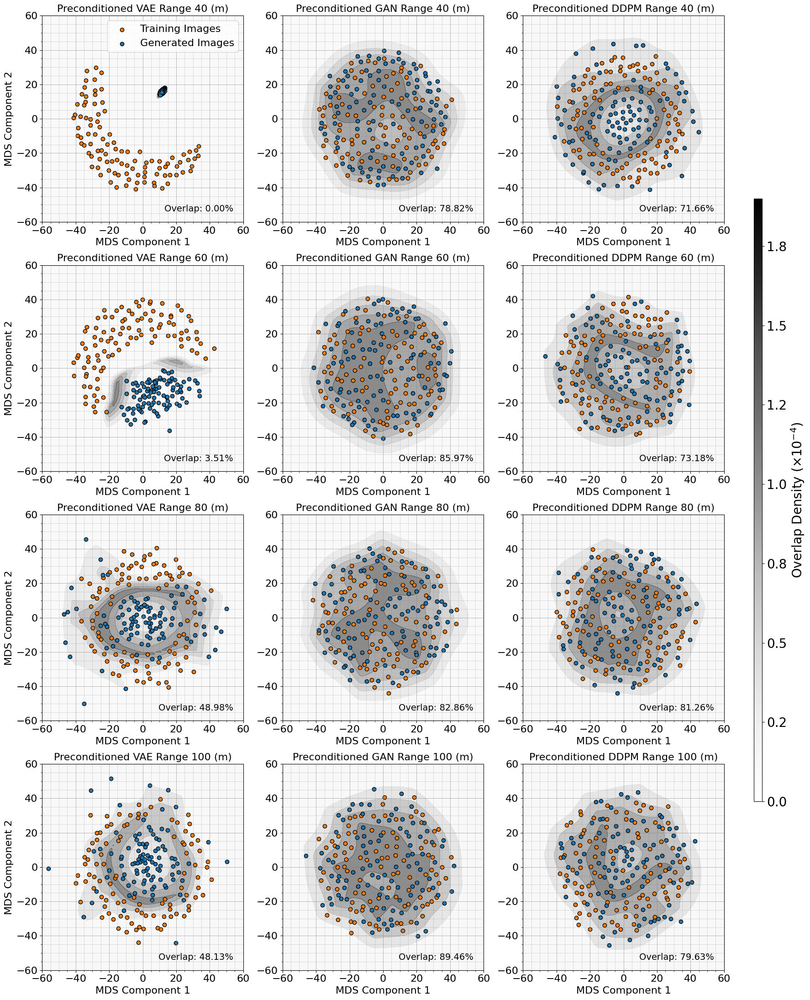

In [47]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import MDS
import matplotlib.pyplot as plt
from sklearn.metrics import pairwise_distances
from scipy.stats import gaussian_kde
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import matplotlib.patches as mpatches

# Dataset identifiers
dataset_numbers = [40, 60, 80, 100]
GANCMDS, VAECMDS,DDPMCMDS = [], [],[]
# Set up for a 4x3 grid plotting
fig, axs = plt.subplots(4, 3, figsize=(18, 22))  # Adjust the figure size as needed
axs = axs.ravel()

# Initialize the scaler
scaler = StandardScaler()

# Load, standardize, compute MDS and plot data for each method
for row, num in enumerate(dataset_numbers):
    for col, method in enumerate(['VAE', 'GAN', 'DDPM']):
        index = row * 3 + col  # Determine the subplot index
        ax = axs[index]

        # Load "real" training data
        # Load "real" training data
        real_data_path = f'VAE GAN DDPM/Training/my_data{num}_32_32COND.npz'
        real_data = np.load(real_data_path)
        real_images = [real_data[key] for key in real_data]
        real_data_flat = np.stack(real_images).squeeze()[:100].reshape(-1, 32*32)
        sca=real_data_flat 
        real_data_flat = scaler.fit_transform(real_data_flat)  # Standardize "real" data

        # Load generated data
        gen_data_path = f'VAE GAN DDPM/{method}/{method}{num}COND.npy' if method == 'VAE' or method == 'DDPM'  else f'VAE GAN DDPM/{method}/{method}{num}COND.npz'
        
        # Check file format to load accordingly
        if gen_data_path.endswith('.npy'):
            gen_data = np.load(gen_data_path).squeeze()
            
        else:  # It's a .npz file
            gen_data_dict = np.load(gen_data_path)
            gen_data = np.stack([gen_data_dict[key] for key in gen_data_dict]).squeeze()
        
        gen_data = gen_data[:100]
        gen_data_flat = gen_data.reshape(-1, 32*32)

        if method =='DDPM' or method == 'VAE' or method == 'GAN':
            gen_data_flat = (gen_data_flat-gen_data_flat.flatten().mean())/gen_data_flat.flatten().std() *sca.flatten().std()+sca.flatten().mean()
        gen_data_flat = scaler.transform(gen_data_flat)  # Standardize generated data with scaler fitted on real data

        combined_data = np.vstack((real_data_flat, gen_data_flat))

        # Combine the new data and generated data
        # Compute the dissimilarity (distance) matrix and perform MDS
        dissimilarity_matrix = pairwise_distances(combined_data, metric='euclidean')
        mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
        mds_transformed_data = mds.fit_transform(dissimilarity_matrix)
        
        # Calculate the overlap
        data1 = mds_transformed_data[:real_data_flat.shape[0], :]
        data2 = mds_transformed_data[real_data_flat.shape[0]:, :]
        kde1 = gaussian_kde(data1.T)
        kde2 = gaussian_kde(data2.T)
        
        # Define a grid over which to evaluate the densities
        global_min_x, global_max_x = -60, 60
        global_min_y, global_max_y = -60, 60
        grid_x, grid_y = np.mgrid[global_min_x:global_max_x:100j, global_min_y:global_max_y:100j]
        positions = np.vstack([grid_x.ravel(), grid_y.ravel()])
        density1 = kde1(positions).reshape(grid_x.shape)
        density2 = kde2(positions).reshape(grid_x.shape)
        overlap_density = np.minimum(density1, density2)

        # Update norm to new overlap_density min and max
        norm.vmin = min(norm.vmin, overlap_density.min()) if norm.vmin is not None else overlap_density.min()
        norm.vmax = max(norm.vmax, overlap_density.max()) if norm.vmax is not None else overlap_density.max()

        # Create a ScalarMappable with the colormap and norm
        sm = cm.ScalarMappable(cmap='Greys', norm=norm)
        sm.set_array([])

        # Plotting
                # Plotting
        ax.contourf(grid_x, grid_y, overlap_density, levels=5, cmap='Greys', alpha=0.5, zorder=1)
        ax.scatter(mds_transformed_data[:real_data_flat.shape[0], 0], mds_transformed_data[:real_data_flat.shape[0], 1], c='C1', label='Training Images', alpha=1, edgecolors='k')
        ax.scatter(mds_transformed_data[real_data_flat.shape[0]:, 0], mds_transformed_data[real_data_flat.shape[0]:, 1], c='C0', label=f'Generated Images', alpha=1, edgecolors='k')

        ax.set_title(f'Preconditioned {method} Range {num} (m)', fontsize=16)
        ax.set_xlabel('MDS Component 1', fontsize=16)
        if col == 0:
            ax.set_ylabel('MDS Component 2', fontsize=16)
        ax.tick_params(axis='both', which='major', labelsize=16)
        ax.set_xlim(global_min_x, global_max_x)
        ax.set_ylim(global_min_y, global_max_y)

        # Calculate and display overlap percentage
        overlap = np.sum(np.minimum(density1, density2))
        overlap_percentage = overlap / np.sum(density1) * 100
        ax.text(0.95, 0.05, f'Overlap: {overlap_percentage:.2f}%', transform=ax.transAxes, fontsize=14, ha='right')
        ax.grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
        if method == 'GAN':

            GANCMDS.append(overlap_percentage)

        if method == 'VAE':

            VAECMDS.append(overlap_percentage)


        if method == 'DDPM':

            DDPMCMDS.append(overlap_percentage)
        # Enable the minor ticks
        ax.minorticks_on()

        # Modify the existing major grid settings if needed, or keep it as is
        ax.grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)
        # Set the legend on the top left plot
        if row == 0 and col == 0:
            ax.legend(fontsize=16)

# Add colorbar to the figure, not the subplots
cbar_ax = fig.add_axes([0.92, 0.2, 0.01, 0.6])
cb = fig.colorbar(sm, cax=cbar_ax)
cb.set_label(r'Overlap Density ($\times 10^{-4}$)', fontsize=20)
cb.ax.tick_params(labelsize=20)

# Custom tick formatter for the colorbar
def multiply_by_10k(x, pos):
    return f'{x * 1e4:.1f}'

formatter = ticker.FuncFormatter(multiply_by_10k)
cb.ax.yaxis.set_major_formatter(formatter)

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust the rect parameter to make room for the colorbar
plt.show()
        # ...

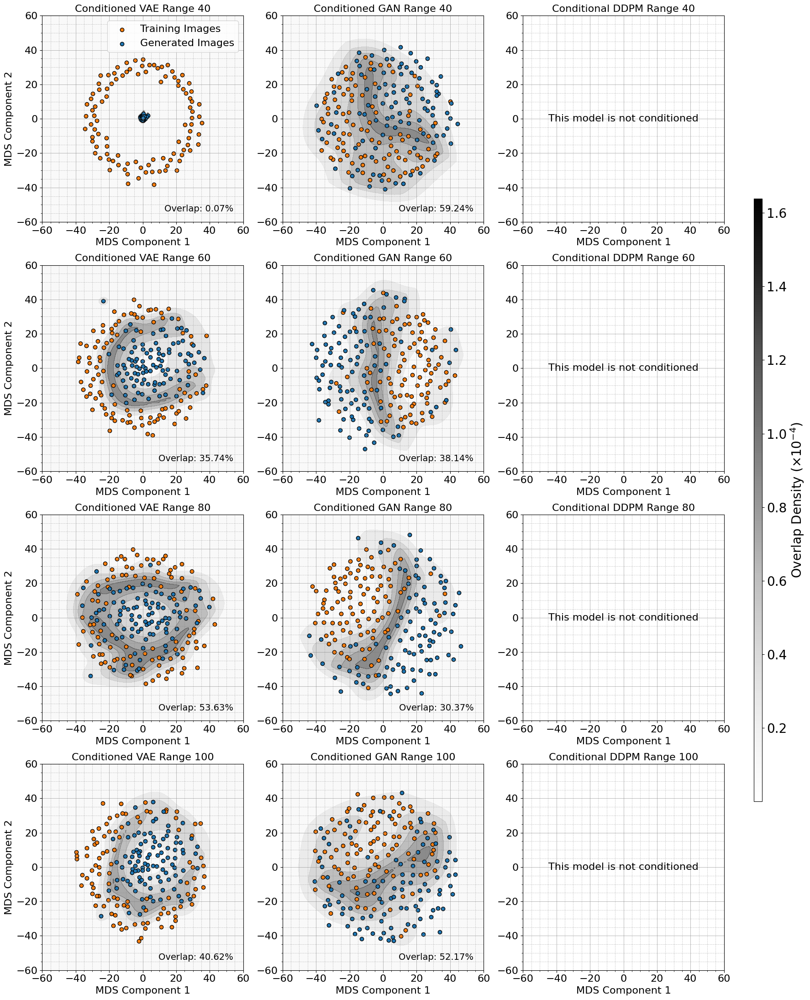

In [45]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import MDS
import matplotlib.pyplot as plt
from sklearn.metrics import pairwise_distances
from scipy.stats import gaussian_kde
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import matplotlib.patches as mpatches
import matplotlib.ticker as ticker

# Dataset identifiers
dataset_numbers = [40, 60, 80, 100]
CVAEMDS = []
CGANMDS=[]
# Set up for a 4x3 grid plotting
fig, axs = plt.subplots(4, 3, figsize=(18, 22))  # Adjust the figure size as needed
axs = axs.ravel()

# Initialize the scaler
scaler = StandardScaler()

# Load, standardize, compute MDS and plot data for each method
for row, num in enumerate(dataset_numbers):
    for col, method in enumerate(['VAE', 'GAN']):
        index = row * 3 + col  # Determine the subplot index
        ax = axs[index]

        # Load "real" training data
        real_data_path = f'VAE GAN DDPM/Training/my_data{num}_32_32COND.npz'
        real_data = np.load(real_data_path)
        real_images = [real_data[key] for key in real_data]
        real_data_flat = np.stack(real_images).squeeze()[:100].reshape(-1, 32*32)
        sca = real_data_flat 
        real_data_flat = scaler.fit_transform(real_data_flat)  # Standardize "real" data

        # Load generated data
        gen_data_path = f'VAE GAN DDPM/{method}/C{method}{num}.npy'
        
        # Check file format to load accordingly
        if gen_data_path.endswith('.npy'):
            gen_data = np.load(gen_data_path).squeeze()
        else:  # It's a .npz file
            gen_data_dict = np.load(gen_data_path)
            gen_data = np.stack([gen_data_dict[key] for key in gen_data_dict]).squeeze()

        gen_data = gen_data[:100]
        if method == 'GAN':
            gen_data = np.rot90(gen_data, k=3, axes=(1, 2))
            gen_data = np.flip(gen_data, axis=2)
            gen_data = np.flip(gen_data, axis=0)

        gen_data_flat = gen_data.reshape(-1, 32*32)
        gen_data_flat = scaler.transform(gen_data_flat)  # Standardize generated data with scaler fitted on real data

        combined_data = np.vstack((real_data_flat, gen_data_flat))

        # Combine the new data and generated data
        # Compute the dissimilarity (distance) matrix and perform MDS
        dissimilarity_matrix = pairwise_distances(combined_data, metric='euclidean')
        mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
        mds_transformed_data = mds.fit_transform(dissimilarity_matrix)
        
        # Calculate the overlap
        data1 = mds_transformed_data[:real_data_flat.shape[0], :]
        data2 = mds_transformed_data[real_data_flat.shape[0]:, :]
        kde1 = gaussian_kde(data1.T)
        kde2 = gaussian_kde(data2.T)
        
        # Define a grid over which to evaluate the densities
        global_min_x, global_max_x = -60, 60
        global_min_y, global_max_y = -60, 60
        grid_x, grid_y = np.mgrid[global_min_x:global_max_x:100j, global_min_y:global_max_y:100j]
        positions = np.vstack([grid_x.ravel(), grid_y.ravel()])
        density1 = kde1(positions).reshape(grid_x.shape)
        density2 = kde2(positions).reshape(grid_x.shape)
        overlap_density = np.minimum(density1, density2)

        # Update norm to new overlap_density min and max
        norm = mcolors.Normalize(vmin=None, vmax=None)
        norm.vmin = min(norm.vmin, overlap_density.min()) if norm.vmin is not None else overlap_density.min()
        norm.vmax = max(norm.vmax, overlap_density.max()) if norm.vmax is not None else overlap_density.max()

        # Create a ScalarMappable with the colormap and norm
        sm = cm.ScalarMappable(cmap='Greys', norm=norm)
        sm.set_array([])

        # Plotting
        ax.contourf(grid_x, grid_y, overlap_density, levels=5, cmap='Greys', alpha=0.5, zorder=1)
        ax.scatter(mds_transformed_data[:real_data_flat.shape[0], 0], mds_transformed_data[:real_data_flat.shape[0], 1], c='C1', label='Training Images', alpha=1, edgecolors='k')
        ax.scatter(mds_transformed_data[real_data_flat.shape[0]:, 0], mds_transformed_data[real_data_flat.shape[0]:, 1], c='C0', label=f'Generated Images', alpha=1, edgecolors='k')

        ax.set_title(f'Conditioned {method} Range {num}', fontsize=16)
        ax.set_xlabel('MDS Component 1', fontsize=16)
        if col == 0:
            ax.set_ylabel('MDS Component 2', fontsize=16)
        ax.tick_params(axis='both', which='major', labelsize=16)
        ax.set_xlim(global_min_x, global_max_x)
        ax.set_ylim(global_min_y, global_max_y)

        # Calculate and display overlap percentage
        overlap = np.sum(np.minimum(density1, density2))
        overlap_percentage = overlap / np.sum(density1) * 100
        ax.text(0.95, 0.05, f'Overlap: {overlap_percentage:.2f}%', transform=ax.transAxes, fontsize=14, ha='right')
        ax.grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
        if method == 'GAN':

            CGANMDS.append(overlap_percentage)

        if method == 'VAE':

            CVAEMDS.append(overlap_percentage)
        # Enable the minor ticks
        ax.minorticks_on()

        # Modify the existing major grid settings if needed, or keep it as is
        ax.grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)
        # Set the legend on the top left plot
        if row == 0 and col == 0:
            ax.legend(fontsize=16)

# Add the third column with the title "Conditional DDPM Range {num}" and add text
for row, num in enumerate(dataset_numbers):
    index = row * 3 + 2  # Determine the subplot index for the third column
    ax = axs[index]
    
    ax.set_title(f'Conditional DDPM Range {num}', fontsize=16)
    ax.text(0.5, 0.5, 'This model is not conditioned', fontsize=16, ha='center', va='center', transform=ax.transAxes)
    ax.set_xlim(global_min_x, global_max_x)
    ax.set_ylim(global_min_y, global_max_y)
    ax.set_xlabel('MDS Component 1', fontsize=16)
    ax.tick_params(axis='both', which='major', labelsize=16)
    ax.grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    ax.minorticks_on()
    ax.grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

# Add colorbar to the figure, not the subplots
cbar_ax = fig.add_axes([0.92, 0.2, 0.01, 0.6])
cb = fig.colorbar(sm, cax=cbar_ax)
cb.set_label(r'Overlap Density ($\times 10^{-4}$)', fontsize=20)
cb.ax.tick_params(labelsize=20)

# Custom tick formatter for the colorbar
def multiply_by_10k(x, pos):
    return f'{x * 1e4:.1f}'

formatter = ticker.FuncFormatter(multiply_by_10k)
cb.ax.yaxis.set_major_formatter(formatter)

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust the rect parameter to make room for the colorbar
plt.show()


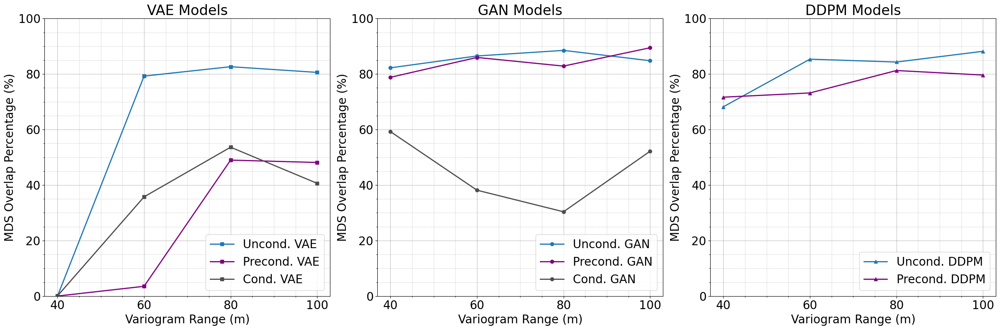

In [51]:
import matplotlib.pyplot as plt

# Data for the x-axis
x_axis = [40, 60, 80, 100]


# Creating subplots for MDS values
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

# Subplot 1: VAE Models MDS
axs[0].plot(x_axis, VAEMDS, color='C0', marker='s', linestyle='-', linewidth=2, label='Uncond. VAE')
axs[0].plot(x_axis, VAECMDS, color='purple', marker='s', linestyle='-', linewidth=2, label='Precond. VAE')
axs[0].plot(x_axis, CVAEMDS, color='#4D4D4D', marker='s', linestyle='-', linewidth=2, label='Cond. VAE')

axs[0].set_title('VAE Models', fontsize=24)
axs[0].set_xlabel('Variogram Range (m)', fontsize=20)
axs[0].set_ylabel('MDS Overlap Percentage (%)', fontsize=20)
axs[0].tick_params(axis='both', which='major', labelsize=20)
axs[0].set_ylim([0, 100])
axs[0].legend(fontsize=20, loc='lower right')
axs[0].set_xticks(x_axis)  # Set x-ticks to only 40, 60, 80, 100
axs[0].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[0].minorticks_on()
axs[0].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

# Subplot 2: GAN Models MDS
axs[1].plot(x_axis, GANMDS, color='C0', marker='o', linestyle='-', linewidth=2, label='Uncond. GAN')
axs[1].plot(x_axis, GANCMDS, color='purple', marker='o', linestyle='-', linewidth=2, label='Precond. GAN')
axs[1].plot(x_axis, CGANMDS, color='#4D4D4D', marker='o', linestyle='-', linewidth=2, label='Cond. GAN')

axs[1].set_title('GAN Models', fontsize=24)
axs[1].set_xlabel('Variogram Range (m)', fontsize=20)
axs[1].set_ylabel('MDS Overlap Percentage (%)', fontsize=20)
axs[1].tick_params(axis='both', which='major', labelsize=20)
axs[1].set_ylim([0, 100])
axs[1].legend(fontsize=20, loc='lower right')
axs[1].set_xticks(x_axis)  # Set x-ticks to only 40, 60, 80, 100
axs[1].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[1].minorticks_on()
axs[1].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

# Subplot 3: DDPM Models MDS
axs[2].plot(x_axis, DDPMMDS, color='C0', marker='^', linestyle='-', linewidth=2, label='Uncond. DDPM')
axs[2].plot(x_axis, DDPMCMDS, color='purple', marker='^', linestyle='-', linewidth=2, label='Precond. DDPM')

axs[2].set_title('DDPM Models', fontsize=24)
axs[2].set_xlabel('Variogram Range (m)', fontsize=20)
axs[2].set_ylabel('MDS Overlap Percentage (%)', fontsize=20)
axs[2].tick_params(axis='both', which='major', labelsize=20)
axs[2].set_ylim([0, 100])
axs[2].legend(fontsize=20, loc='lower right')
axs[2].set_xticks(x_axis)  # Set x-ticks to only 40, 60, 80, 100
axs[2].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[2].minorticks_on()
axs[2].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

plt.tight_layout()
plt.show()


#### Spatial Continuity Check 

Spatial continuity reproduction is checked by comparing the expected experimental variograms from training images and genAI-generated realizations.

$$
\gamma(h) = \frac{1}{2} \mathbb{E}[(Z(u) - Z(u+h))^2] 
$$

where $\gamma(h)$ is the experimental variogram for a lag $h$, $\mathbb{E}$ is the expected value, $Z(u)$ is the value at location $u$ and $Z(u+h)$ is the value at location $u+h$. The experimental variograms are compared using interquartile overlap ($C_{Spatial,\text{overlap}}$) for spatial variability and difference degree ($\Delta \gamma$) of genAI-generated realizations and training images to the median experimental variogram of training images (Zhang et al., 2021) for accuracy.

$$
\Delta \gamma_{TI} = \frac{1}{L} \sum_{i=1}^{L} \sum_{h=0}^{\text{range}} \left(\gamma_{TI}(x_i,h) - \gamma_{\text{average}}(h)\right)^2 
$$

$$
\Delta \gamma_{GI} = \frac{1}{L} \sum_{i=1}^{L} \sum_{h=0}^{\text{range}} \left(\gamma_{GI}(x_i,h) - \gamma_{\text{average}}(h)\right)^2
$$

and the overlap percentage is calculated as,

$$
C_{Spatial,\text{overlap}} = \frac{1}{n_{\text{lag}}} \sum_{h}^{\text{range}} \text{min}\left(\gamma_{TI}(h), \gamma_{GI}(h)\right) \times 100
$$

where $\gamma_{TI}(x_i,h)$ are the experimental variograms for TIs, $\gamma_{\text{P50}}(h)$ is the average variogram calculated from $\gamma_{TI}(x_i,h)$. $\gamma_{GI}(x_i,h)$ are the experimental variograms for genAI-generated realizations, $L$ is the number of realizations, and $n_{\text{lag}}$ is the number of lags. The closer $\Delta \gamma_{GI}$ is to $\Delta \gamma_{TI}$, the more accurate the spatial continuity reproduction. A $C_{Spatial,\text{overlap}}$ of 100% represents perfect spatial variability reproduction, whereas lower values indicate less reproduction. Both accuracy and variability reproduction are important for this check.


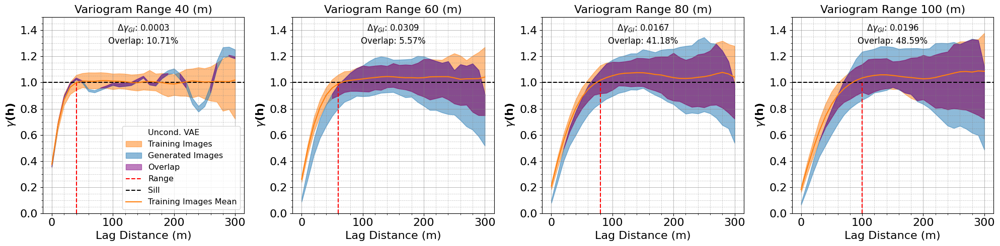

In [52]:
# Initialize list to store results
variogram_results = []
MSE=[]
MSE2=[]
# Epochs to process
Ranges = [40, 60, 80, 100]

# Process data and append results
for i, Range in enumerate(Ranges):

    new_data_path =  f'VAE GAN DDPM/Training/my_data{Range}_32_32.npz'
    new_data = np.load(new_data_path, allow_pickle=True)
    new_images = [new_data[key] for key in new_data]
    combined_new_tensor = np.stack(new_images).squeeze()[:150]
    nlag_new, median_new, iqr_new,Vari1 = calculate_variograms(combined_new_tensor)
    interpolation_function = interp1d(nlag_new, median_new, kind='linear')
    # Load epoch data
    data_path = f'VAE GAN DDPM/VAE/VAE{Range}.npy'
    data = np.load(data_path, allow_pickle=True)
    
    combined_tensor = data.squeeze()[:150]
    nlag, median_epoch, iqr_epoch,Vari2 = calculate_variograms(combined_tensor)
    
    
    MSE.append(np.mean((interpolation_function(nlag[:i+1])-Vari2[:,:i+1])**2))
    MSE2.append(np.mean((interpolation_function(nlag[:i+1])-Vari1[:,:i+1])**2))

    # Append results
    variogram_results.append({
        'Range': Range,
        'New Data': {'nlag': nlag_new, 'median': (median_new ), 'iqr': (iqr_new)},
        'Epoch Data': {'nlag': nlag, 'median': (median_epoch), 'iqr': (iqr_epoch)}
    })

fig, axs = plt.subplots(1, 4, figsize=(20, 5))
axs = axs.flatten()

Delta_Gamma_VAE = []
Overlap_Gamma_VAE = []


for i, result in enumerate(variogram_results):
    Range = result['Range']
    nlag_new = result['New Data']['nlag']
    median_new = result['New Data']['median']
    iqr_new = result['New Data']['iqr']
    nlag = result['Epoch Data']['nlag']
    median_epoch = result['Epoch Data']['median']
    iqr_epoch = result['Epoch Data']['iqr']
    axs[i].plot([], [], ' ', label='Uncond. VAE')

    # Plot IQR and median for new data as reference
    axs[i].fill_between(nlag_new, iqr_new[0, :], iqr_new[1, :], color='C1', alpha=0.5, label='Training Images')

    # Plot IQR and median for epoch data
    axs[i].fill_between(nlag, iqr_epoch[0, :], iqr_epoch[1, :], color='C0', alpha=0.5, label='Generated Images')
    lower_bound = np.maximum(iqr_epoch[0, :], iqr_new[0, :])
    upper_bound = np.minimum(iqr_epoch[1, :], iqr_new[1, :])
    overlap = np.where(upper_bound >= lower_bound, True, False)
    axs[i].fill_between(nlag, lower_bound * overlap, upper_bound * overlap, where=overlap, color='purple', alpha=0.5, label='Overlap')
    axs[i].vlines(x=Range,  ymin=0, ymax=1, color='r', linestyle='--', label=f'Range')
    axs[i].axhline(y=1, color='k', linestyle='--', label='Sill')
    axs[i].plot(nlag_new, median_new, color='C1',alpha=1, label='Training Images Mean')

    Oc = abs((lower_bound * overlap-upper_bound * overlap)[:int(Range/10)]).mean()
    Tot = abs((iqr_new[0, :]-iqr_new[1, :])[:int(Range/10)]).mean()
    axs[i].text(0.5, 0.97, f'$\\Delta \\gamma_{{GI}}$: {MSE[i]:.4f}', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)
    axs[i].text(0.5, 0.90, f'Overlap: {Oc/Tot*100:.2f}%', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)
    axs[i].set_title(f'Variogram Range {Range} (m)', fontsize = 16)
    axs[i].set_xlabel('Lag Distance (m)', fontsize = 16)
    axs[i].set_ylabel(r'$\gamma \bf(h)$', fontsize= 16)
    axs[i].tick_params(axis='both', which='major', labelsize=16)
    axs[i].set_ylim(0, 1.5)  # Adjust this range based on your data
    Delta_Gamma_VAE.append(MSE[i])
    Overlap_Gamma_VAE.append(Oc/Tot*100)
    axs[i].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    
    # Enable the minor ticks
    axs[i].minorticks_on()

    # Modify the existing major grid settings if needed, or keep it as is
    axs[i].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)
    if i ==0:
        axs[i].legend(fontsize = 11.5, loc = 'lower right')

plt.tight_layout()
plt.show()


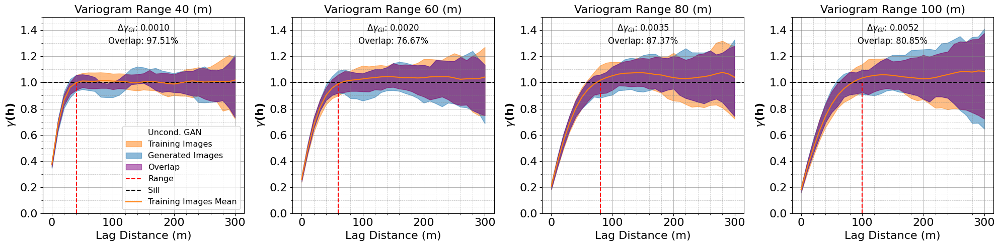

In [53]:
# Initialize list to store results
variogram_results = []
MSE=[]
MSE2=[]
# Epochs to process
Ranges = [40, 60, 80, 100]

# Process data and append results
for i, Range in enumerate(Ranges):

    new_data_path =  f'VAE GAN DDPM/Training/my_data{Range}_32_32.npz'
    new_data = np.load(new_data_path, allow_pickle=True)
    new_images = [new_data[key] for key in new_data]
    combined_new_tensor = np.stack(new_images).squeeze()[:150]
    nlag_new, median_new, iqr_new,Vari1 = calculate_variograms(combined_new_tensor)
    interpolation_function = interp1d(nlag_new, median_new, kind='linear')
    # Load epoch data
    data_path = f'VAE GAN DDPM/GAN/GAN{Range}.npz'
    data = np.load(data_path, allow_pickle=True)
    images = [data[key] for key in data]
    combined_tensor = np.stack(images).squeeze()[:150]
    
    nlag, median_epoch, iqr_epoch,Vari2 = calculate_variograms(combined_tensor)
    
    
    MSE.append(np.mean((interpolation_function(nlag[:i+1])-Vari2[:,:i+1])**2))
    MSE2.append(np.mean((interpolation_function(nlag[:i+1])-Vari1[:,:i+1])**2))

    # Append results
    variogram_results.append({
        'Range': Range,
        'New Data': {'nlag': nlag_new, 'median': (median_new ), 'iqr': (iqr_new)},
        'Epoch Data': {'nlag': nlag, 'median': (median_epoch), 'iqr': (iqr_epoch)}
    })

fig, axs = plt.subplots(1, 4, figsize=(20, 5))
axs = axs.flatten()


Delta_Gamma_GAN = []
Overlap_Gamma_GAN = []

for i, result in enumerate(variogram_results):
    Range = result['Range']
    nlag_new = result['New Data']['nlag']
    median_new = result['New Data']['median']
    iqr_new = result['New Data']['iqr']
    nlag = result['Epoch Data']['nlag']
    median_epoch = result['Epoch Data']['median']
    iqr_epoch = result['Epoch Data']['iqr']
    axs[i].plot([], [], ' ', label='Uncond. GAN')
    # Plot IQR and median for new data as reference
    axs[i].fill_between(nlag_new, iqr_new[0, :], iqr_new[1, :], color='C1', alpha=0.5, label='Training Images')

    # Plot IQR and median for epoch data
    axs[i].fill_between(nlag, iqr_epoch[0, :], iqr_epoch[1, :], color='C0', alpha=0.5, label='Generated Images')
    lower_bound = np.maximum(iqr_epoch[0, :], iqr_new[0, :])
    upper_bound = np.minimum(iqr_epoch[1, :], iqr_new[1, :])
    overlap = np.where(upper_bound >= lower_bound, True, False)
    axs[i].fill_between(nlag, lower_bound * overlap, upper_bound * overlap, where=overlap, color='purple', alpha=0.5, label='Overlap')

    axs[i].vlines(x=Range,  ymin=0, ymax=1, color='r', linestyle='--', label=f'Range')
    axs[i].axhline(y=1, color='k', linestyle='--', label='Sill')
    axs[i].plot(nlag_new, median_new, color='C1',alpha=1, label='Training Images Mean')

    Oc = abs((lower_bound * overlap-upper_bound * overlap)[:int(Range/10)]).mean()
    Tot = abs((iqr_new[0, :]-iqr_new[1, :])[:int(Range/10)]).mean()
    axs[i].text(0.5, 0.97, f'$\\Delta \\gamma_{{GI}}$: {MSE[i]:.4f}', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)
    axs[i].text(0.5, 0.90, f'Overlap: {Oc/Tot*100:.2f}%', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)
    axs[i].set_title(f'Variogram Range {Range} (m)', fontsize = 16)
    axs[i].set_xlabel('Lag Distance (m)', fontsize = 16)
    axs[i].set_ylabel(r'$\gamma \bf(h)$', fontsize= 16)
    axs[i].tick_params(axis='both', which='major', labelsize=16)
    axs[i].set_ylim(0, 1.5)  # Adjust this range based on your data

    axs[i].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    Delta_Gamma_GAN.append(MSE[i])
    Overlap_Gamma_GAN.append(Oc/Tot*100)
    # Enable the minor ticks
    axs[i].minorticks_on()

    # Modify the existing major grid settings if needed, or keep it as is
    axs[i].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)
    if i ==0:
        axs[i].legend(fontsize = 11.5, loc = 'lower right')

plt.tight_layout()
plt.show()


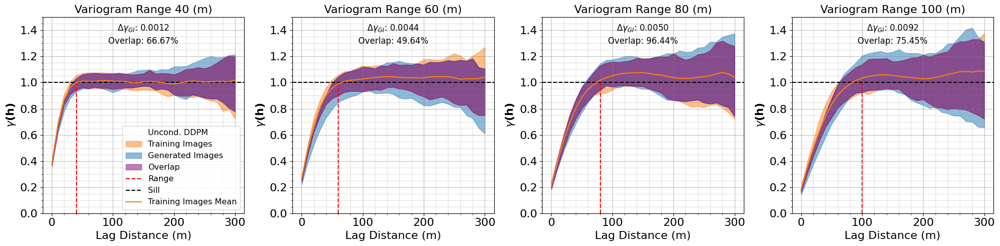

In [54]:
# Initialize list to store results
variogram_results = []
MSE=[]
MSE2=[]
# Epochs to process
Ranges = [40, 60, 80, 100]

# Process data and append results
for i, Range in enumerate(Ranges):

    new_data_path =  f'VAE GAN DDPM/Training/my_data{Range}_32_32.npz'
    new_data = np.load(new_data_path, allow_pickle=True)
    new_images = [new_data[key] for key in new_data]
    combined_new_tensor = np.stack(new_images).squeeze()[:150]
    nlag_new, median_new, iqr_new,Vari1 = calculate_variograms(combined_new_tensor)
    interpolation_function = interp1d(nlag_new, median_new, kind='linear')
    # Load epoch data
    data_path = f'VAE GAN DDPM/DDPM/DDPM{Range}.npy'
    data = np.load(data_path, allow_pickle=True)
    
    combined_tensor = data.squeeze()[:150]
    nlag, median_epoch, iqr_epoch,Vari2 = calculate_variograms(combined_tensor)
    
    
    MSE.append(np.mean((interpolation_function(nlag[:i+1])-Vari2[:,:i+1])**2))
    MSE2.append(np.mean((interpolation_function(nlag[:i+1])-Vari1[:,:i+1])**2))

    # Append results
    variogram_results.append({
        'Range': Range,
        'New Data': {'nlag': nlag_new, 'median': (median_new ), 'iqr': (iqr_new)},
        'Epoch Data': {'nlag': nlag, 'median': (median_epoch), 'iqr': (iqr_epoch)}
    })

fig, axs = plt.subplots(1, 4, figsize=(20, 5))
axs = axs.flatten()

Delta_Gamma_DDPM = []
Overlap_Gamma_DDPM = []

for i, result in enumerate(variogram_results):
    Range = result['Range']
    nlag_new = result['New Data']['nlag']
    median_new = result['New Data']['median']
    iqr_new = result['New Data']['iqr']
    nlag = result['Epoch Data']['nlag']
    median_epoch = result['Epoch Data']['median']
    iqr_epoch = result['Epoch Data']['iqr']
    axs[i].plot([], [], ' ', label='Uncond. DDPM')
    # Plot IQR and median for new data as reference
    axs[i].fill_between(nlag_new, iqr_new[0, :], iqr_new[1, :], color='C1', alpha=0.5, label='Training Images')

    # Plot IQR and median for epoch data
    axs[i].fill_between(nlag, iqr_epoch[0, :], iqr_epoch[1, :], color='C0', alpha=0.5, label='Generated Images')
    lower_bound = np.maximum(iqr_epoch[0, :], iqr_new[0, :])
    upper_bound = np.minimum(iqr_epoch[1, :], iqr_new[1, :])
    overlap = np.where(upper_bound >= lower_bound, True, False)
    axs[i].fill_between(nlag, lower_bound * overlap, upper_bound * overlap, where=overlap, color='purple', alpha=0.5, label='Overlap')

    axs[i].vlines(x=Range,  ymin=0, ymax=1, color='r', linestyle='--', label=f'Range')
    axs[i].axhline(y=1, color='k', linestyle='--', label='Sill')
    axs[i].plot(nlag_new, median_new, color='C1',alpha=1, label='Training Images Mean')

    Oc = abs((lower_bound * overlap-upper_bound * overlap)[:int(Range/10)]).mean()
    Tot = abs((iqr_new[0, :]-iqr_new[1, :])[:int(Range/10)]).mean()
    axs[i].text(0.5, 0.97, f'$\\Delta \\gamma_{{GI}}$: {MSE[i]:.4f}', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)
    axs[i].text(0.5, 0.90, f'Overlap: {Oc/Tot*100:.2f}%', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)
    axs[i].set_title(f'Variogram Range {Range} (m)', fontsize = 16)
    axs[i].set_xlabel('Lag Distance (m)', fontsize = 16)
    axs[i].set_ylabel(r'$\gamma \bf(h)$', fontsize= 16)
    axs[i].tick_params(axis='both', which='major', labelsize=16)
    axs[i].set_ylim(0, 1.5)  # Adjust this range based on your data
    Delta_Gamma_DDPM.append(MSE[i])
    Overlap_Gamma_DDPM.append(Oc/Tot*100)
    axs[i].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    
    # Enable the minor ticks
    axs[i].minorticks_on()

    # Modify the existing major grid settings if needed, or keep it as is
    axs[i].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)
    if i ==0:
        axs[i].legend(fontsize = 11.5, loc = 'lower right')

plt.tight_layout()
plt.show()


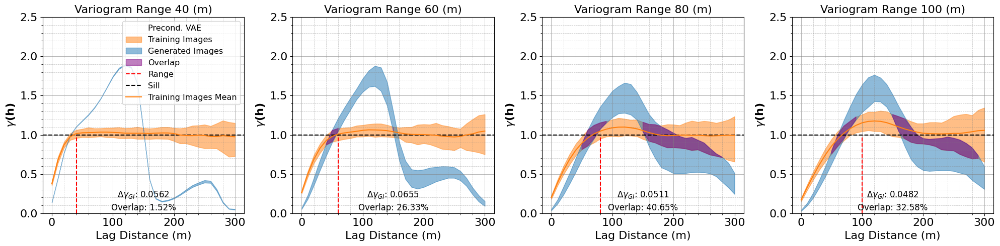

In [55]:
# Initialize list to store results
variogram_results = []
MSE=[]
MSE2=[]
# Epochs to process
Ranges = [40, 60, 80, 100]

# Process data and append results
for i, Range in enumerate(Ranges):

    new_data_path =  f'VAE GAN DDPM/Training/my_data{Range}_32_32COND.npz'
    new_data = np.load(new_data_path, allow_pickle=True)
    new_images = [new_data[key] for key in new_data]
    combined_new_tensor = np.stack(new_images).squeeze()[:150]
    nlag_new, median_new, iqr_new,Vari1 = calculate_variograms(combined_new_tensor)
    interpolation_function = interp1d(nlag_new, median_new, kind='linear')
    # Load epoch data
    data_path = f'VAE GAN DDPM/VAE/VAE{Range}COND.npy'
    data = np.load(data_path, allow_pickle=True)
    
    combined_tensor = data.squeeze()[:150]
    nlag, median_epoch, iqr_epoch,Vari2 = calculate_variograms(combined_tensor)
    
    
    MSE.append(np.mean((interpolation_function(nlag[:i+1])-Vari2[:,:i+1])**2))
    MSE2.append(np.mean((interpolation_function(nlag[:i+1])-Vari1[:,:i+1])**2))

    # Append results
    variogram_results.append({
        'Range': Range,
        'New Data': {'nlag': nlag_new, 'median': (median_new ), 'iqr': (iqr_new)},
        'Epoch Data': {'nlag': nlag, 'median': (median_epoch), 'iqr': (iqr_epoch)}
    })

fig, axs = plt.subplots(1, 4, figsize=(20, 5))
axs = axs.flatten()

Delta_Gamma_VAECOND = []
Overlap_Gamma_VAECOND = []


for i, result in enumerate(variogram_results):
    Range = result['Range']
    nlag_new = result['New Data']['nlag']
    median_new = result['New Data']['median']
    iqr_new = result['New Data']['iqr']
    nlag = result['Epoch Data']['nlag']
    median_epoch = result['Epoch Data']['median']
    iqr_epoch = result['Epoch Data']['iqr']
    axs[i].plot([], [], ' ', label='Precond. VAE')

    # Plot IQR and median for new data as reference
    axs[i].fill_between(nlag_new, iqr_new[0, :], iqr_new[1, :], color='C1', alpha=0.5, label='Training Images')

    # Plot IQR and median for epoch data
    axs[i].fill_between(nlag, iqr_epoch[0, :], iqr_epoch[1, :], color='C0', alpha=0.5, label='Generated Images')
    lower_bound = np.maximum(iqr_epoch[0, :], iqr_new[0, :])
    upper_bound = np.minimum(iqr_epoch[1, :], iqr_new[1, :])
    overlap = np.where(upper_bound >= lower_bound, True, False)
    axs[i].fill_between(nlag, lower_bound * overlap, upper_bound * overlap, where=overlap, color='purple', alpha=0.5, label='Overlap')

    axs[i].vlines(x=Range,  ymin=0, ymax=1, color='r', linestyle='--', label=f'Range')
    axs[i].axhline(y=1, color='k', linestyle='--', label='Sill')
    axs[i].plot(nlag_new, median_new, color='C1',alpha=1, label='Training Images Mean')

    Oc = abs((lower_bound * overlap-upper_bound * overlap)[:int(Range/10)]).mean()
    Tot = abs((iqr_new[0, :]-iqr_new[1, :])[:int(Range/10)]).mean()
    axs[i].text(0.5, 0.12, f'$\\Delta \\gamma_{{GI}}$: {MSE[i]:.4f}', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)
    axs[i].text(0.5, 0.05, f'Overlap: {Oc/Tot*100:.2f}%', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)
    axs[i].set_title(f'Variogram Range {Range} (m)', fontsize = 16)
    axs[i].set_xlabel('Lag Distance (m)', fontsize = 16)
    axs[i].set_ylabel(r'$\gamma \bf(h)$', fontsize= 16)
    axs[i].tick_params(axis='both', which='major', labelsize=16)
    axs[i].set_ylim(0, 2.5)  # Adjust this range based on your data

    axs[i].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)

    Delta_Gamma_VAECOND.append(MSE[i])
    Overlap_Gamma_VAECOND.append(Oc/Tot*100)
    # Enable the minor ticks
    axs[i].minorticks_on()

    # Modify the existing major grid settings if needed, or keep it as is
    axs[i].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)
    if i ==0:
        axs[i].legend(fontsize = 11.5, loc = 'upper right')

plt.tight_layout()
plt.show()


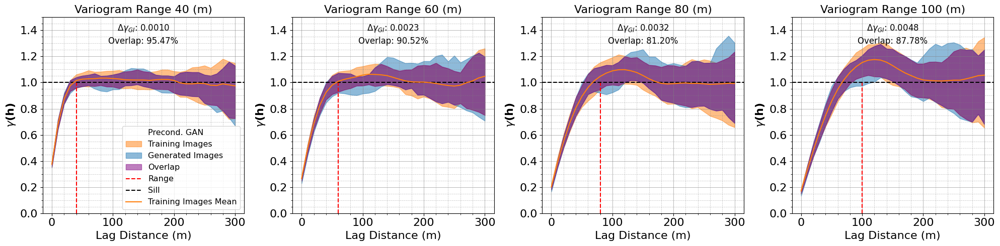

In [56]:
# Initialize list to store results
variogram_results = []
MSE=[]
MSE2=[]
# Epochs to process
Ranges = [40, 60, 80, 100]

# Process data and append results
for i, Range in enumerate(Ranges):

    new_data_path =  f'VAE GAN DDPM/Training/my_data{Range}_32_32COND.npz'
    new_data = np.load(new_data_path, allow_pickle=True)
    new_images = [new_data[key] for key in new_data]
    combined_new_tensor = np.stack(new_images).squeeze()[:150]
    nlag_new, median_new, iqr_new,Vari1 = calculate_variograms(combined_new_tensor)
    interpolation_function = interp1d(nlag_new, median_new, kind='linear')
    # Load epoch data
    data_path = f'VAE GAN DDPM/GAN/GAN{Range}COND.npz'
    data = np.load(data_path, allow_pickle=True)
    images = [data[key] for key in data]
    combined_tensor = np.stack(images).squeeze()[:150]
    
    nlag, median_epoch, iqr_epoch,Vari2 = calculate_variograms(combined_tensor)
    
    
    MSE.append(np.mean((interpolation_function(nlag[:i+1])-Vari2[:,:i+1])**2))
    MSE2.append(np.mean((interpolation_function(nlag[:i+1])-Vari1[:,:i+1])**2))

    # Append results
    variogram_results.append({
        'Range': Range,
        'New Data': {'nlag': nlag_new, 'median': (median_new ), 'iqr': (iqr_new)},
        'Epoch Data': {'nlag': nlag, 'median': (median_epoch), 'iqr': (iqr_epoch)}
    })

fig, axs = plt.subplots(1, 4, figsize=(20, 5))
axs = axs.flatten()

Delta_Gamma_GANCOND = []
Overlap_Gamma_GANCOND = []


for i, result in enumerate(variogram_results):
    Range = result['Range']
    nlag_new = result['New Data']['nlag']
    median_new = result['New Data']['median']
    iqr_new = result['New Data']['iqr']
    nlag = result['Epoch Data']['nlag']
    median_epoch = result['Epoch Data']['median']
    iqr_epoch = result['Epoch Data']['iqr']
    axs[i].plot([], [], ' ', label='Precond. GAN')
    # Plot IQR and median for new data as reference
    axs[i].fill_between(nlag_new, iqr_new[0, :], iqr_new[1, :], color='C1', alpha=0.5, label='Training Images')

    # Plot IQR and median for epoch data
    axs[i].fill_between(nlag, iqr_epoch[0, :], iqr_epoch[1, :], color='C0', alpha=0.5, label='Generated Images')
    lower_bound = np.maximum(iqr_epoch[0, :], iqr_new[0, :])
    upper_bound = np.minimum(iqr_epoch[1, :], iqr_new[1, :])
    overlap = np.where(upper_bound >= lower_bound, True, False)
    axs[i].fill_between(nlag, lower_bound * overlap, upper_bound * overlap, where=overlap, color='purple', alpha=0.5, label='Overlap')

    axs[i].vlines(x=Range,  ymin=0, ymax=1, color='r', linestyle='--', label=f'Range')
    axs[i].axhline(y=1, color='k', linestyle='--', label='Sill')
    axs[i].plot(nlag_new, median_new, color='C1',alpha=1, label='Training Images Mean')

    Oc = abs((lower_bound * overlap-upper_bound * overlap)[:int(Range/10)]).mean()
    Tot = abs((iqr_new[0, :]-iqr_new[1, :])[:int(Range/10)]).mean()
    axs[i].text(0.5, 0.97, f'$\\Delta \\gamma_{{GI}}$: {MSE[i]:.4f}', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)
    axs[i].text(0.5, 0.90, f'Overlap: {Oc/Tot*100:.2f}%', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)
    axs[i].set_title(f'Variogram Range {Range} (m)', fontsize = 16)
    axs[i].set_xlabel('Lag Distance (m)', fontsize = 16)
    axs[i].set_ylabel(r'$\gamma \bf(h)$', fontsize= 16)
    axs[i].tick_params(axis='both', which='major', labelsize=16)
    axs[i].set_ylim(0, 1.5)  # Adjust this range based on your data
    Delta_Gamma_GANCOND.append(MSE[i])
    Overlap_Gamma_GANCOND.append(Oc/Tot*100)
    axs[i].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    
    # Enable the minor ticks
    axs[i].minorticks_on()

    # Modify the existing major grid settings if needed, or keep it as is
    axs[i].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)
    if i ==0:
        axs[i].legend(fontsize = 11.5, loc = 'lower right')

plt.tight_layout()
plt.show()


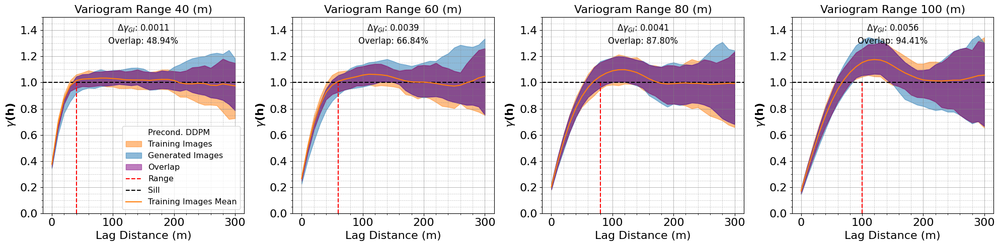

In [57]:
# Initialize list to store results
variogram_results = []
MSE=[]
MSE2=[]
# Epochs to process
Ranges = [40, 60, 80, 100]

# Process data and append results
for i, Range in enumerate(Ranges):

    new_data_path =  f'VAE GAN DDPM/Training/my_data{Range}_32_32COND.npz'
    new_data = np.load(new_data_path, allow_pickle=True)
    new_images = [new_data[key] for key in new_data]
    combined_new_tensor = np.stack(new_images).squeeze()[:150]
    nlag_new, median_new, iqr_new,Vari1 = calculate_variograms(combined_new_tensor)
    interpolation_function = interp1d(nlag_new, median_new, kind='linear')
    # Load epoch data
    data_path = f'VAE GAN DDPM/DDPM/DDPM{Range}COND.npy'
    data = np.load(data_path, allow_pickle=True)
    
    combined_tensor = data.squeeze()[:150]
    nlag, median_epoch, iqr_epoch,Vari2 = calculate_variograms(combined_tensor)
    
    
    MSE.append(np.mean((interpolation_function(nlag[:i+1])-Vari2[:,:i+1])**2))
    MSE2.append(np.mean((interpolation_function(nlag[:i+1])-Vari1[:,:i+1])**2))

    # Append results
    variogram_results.append({
        'Range': Range,
        'New Data': {'nlag': nlag_new, 'median': (median_new ), 'iqr': (iqr_new)},
        'Epoch Data': {'nlag': nlag, 'median': (median_epoch), 'iqr': (iqr_epoch)}
    })

fig, axs = plt.subplots(1, 4, figsize=(20, 5))
axs = axs.flatten()


Delta_Gamma_DDPMCOND = []
Overlap_Gamma_DDPMCOND = []

for i, result in enumerate(variogram_results):
    Range = result['Range']
    nlag_new = result['New Data']['nlag']
    median_new = result['New Data']['median']
    iqr_new = result['New Data']['iqr']
    nlag = result['Epoch Data']['nlag']
    median_epoch = result['Epoch Data']['median']
    iqr_epoch = result['Epoch Data']['iqr']
    axs[i].plot([], [], ' ', label='Precond. DDPM')
    # Plot IQR and median for new data as reference
    axs[i].fill_between(nlag_new, iqr_new[0, :], iqr_new[1, :], color='C1', alpha=0.5, label='Training Images')

    # Plot IQR and median for epoch data
    axs[i].fill_between(nlag, iqr_epoch[0, :], iqr_epoch[1, :], color='C0', alpha=0.5, label='Generated Images')
    lower_bound = np.maximum(iqr_epoch[0, :], iqr_new[0, :])
    upper_bound = np.minimum(iqr_epoch[1, :], iqr_new[1, :])
    overlap = np.where(upper_bound >= lower_bound, True, False)
    axs[i].fill_between(nlag, lower_bound * overlap, upper_bound * overlap, where=overlap, color='purple', alpha=0.5, label='Overlap')

    axs[i].vlines(x=Range,  ymin=0, ymax=1, color='r', linestyle='--', label=f'Range')
    axs[i].axhline(y=1, color='k', linestyle='--', label='Sill')
    axs[i].plot(nlag_new, median_new, color='C1',alpha=1, label='Training Images Mean')

    Oc = abs((lower_bound * overlap-upper_bound * overlap)[:int(Range/10)]).mean()
    Tot = abs((iqr_new[0, :]-iqr_new[1, :])[:int(Range/10)]).mean()
    axs[i].text(0.5, 0.97, f'$\\Delta \\gamma_{{GI}}$: {MSE[i]:.4f}', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)
    axs[i].text(0.5, 0.90, f'Overlap: {Oc/Tot*100:.2f}%', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)
    axs[i].set_title(f'Variogram Range {Range} (m)', fontsize = 16)
    axs[i].set_xlabel('Lag Distance (m)', fontsize = 16)
    axs[i].set_ylabel(r'$\gamma \bf(h)$', fontsize= 16)
    axs[i].tick_params(axis='both', which='major', labelsize=16)
    axs[i].set_ylim(0, 1.5)  # Adjust this range based on your data
    Delta_Gamma_DDPMCOND.append(MSE[i])
    Overlap_Gamma_DDPMCOND.append(Oc/Tot*100)
    axs[i].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    
    # Enable the minor ticks
    axs[i].minorticks_on()

    # Modify the existing major grid settings if needed, or keep it as is
    axs[i].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)
    if i ==0:
        axs[i].legend(fontsize = 11.5, loc = 'lower right')

plt.tight_layout()
plt.show()


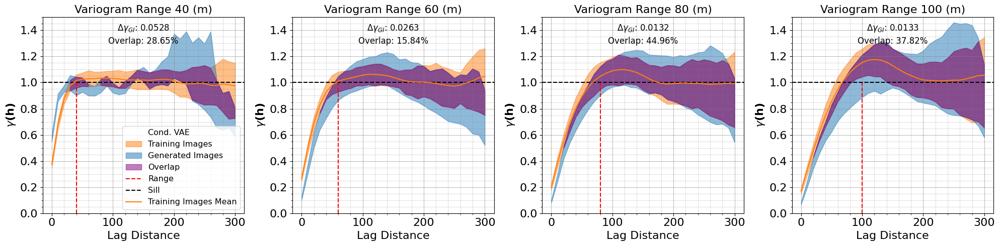

In [58]:
# Initialize list to store results
variogram_results = []
MSE=[]
MSE2=[]
# Epochs to process
Ranges = [40, 60, 80, 100]

# Process data and append results
for i, Range in enumerate(Ranges):
    # Load new data

    new_data_path =  f'VAE GAN DDPM/Training/my_data{Range}_32_32COND.npz'
    new_data = np.load(new_data_path, allow_pickle=True)
    new_images = [new_data[key] for key in new_data]
    combined_new_tensor = np.stack(new_images).squeeze()[:150]
    nlag_new, median_new, iqr_new,Vari1 = calculate_variograms(combined_new_tensor)
    interpolation_function = interp1d(nlag_new, median_new, kind='linear')
    # Load epoch data
    data_path = f'VAE GAN DDPM/VAE/CVAE{Range}.npy'
    data = np.load(data_path, allow_pickle=True)
    
    combined_tensor = data.squeeze()[:150]
    nlag, median_epoch, iqr_epoch,Vari2 = calculate_variograms(combined_tensor)
    
    
    MSE.append(np.mean((interpolation_function(nlag[:i+1])-Vari2[:,:i+1])**2))
    MSE2.append(np.mean((interpolation_function(nlag[:i+1])-Vari1[:,:i+1])**2))

    # Append results
    variogram_results.append({
        'Range': Range,
        'New Data': {'nlag': nlag_new, 'median': (median_new ), 'iqr': (iqr_new)},
        'Epoch Data': {'nlag': nlag, 'median': (median_epoch), 'iqr': (iqr_epoch)}
    })

fig, axs = plt.subplots(1, 4, figsize=(20, 5))
axs = axs.flatten()

Delta_Gamma_CVAE=[]
Overlap_Gamma_CVAE=[]


for i, result in enumerate(variogram_results):
    Range = result['Range']
    nlag_new = result['New Data']['nlag']
    median_new = result['New Data']['median']
    iqr_new = result['New Data']['iqr']
    nlag = result['Epoch Data']['nlag']
    median_epoch = result['Epoch Data']['median']
    iqr_epoch = result['Epoch Data']['iqr']
    axs[i].plot([], [], ' ', label='Cond. VAE')

    # Plot IQR and median for new data as reference
    axs[i].fill_between(nlag_new, iqr_new[0, :], iqr_new[1, :], color='C1', alpha=0.5, label='Training Images')

    # Plot IQR and median for epoch data
    axs[i].fill_between(nlag, iqr_epoch[0, :], iqr_epoch[1, :], color='C0', alpha=0.5, label='Generated Images')
    lower_bound = np.maximum(iqr_epoch[0, :], iqr_new[0, :])
    upper_bound = np.minimum(iqr_epoch[1, :], iqr_new[1, :])
    overlap = np.where(upper_bound >= lower_bound, True, False)
    axs[i].fill_between(nlag, lower_bound * overlap, upper_bound * overlap, where=overlap, color='purple', alpha=0.5, label='Overlap')

    axs[i].vlines(x=Range,  ymin=0, ymax=1, color='r', linestyle='--', label=f'Range')
    axs[i].axhline(y=1, color='k', linestyle='--', label='Sill')
    axs[i].plot(nlag_new, median_new, color='C1',alpha=1, label='Training Images Mean')

    Oc = abs((lower_bound * overlap-upper_bound * overlap)[:int(Range/10)]).mean()
    Tot = abs((iqr_new[0, :]-iqr_new[1, :])[:int(Range/10)]).mean()
    axs[i].text(0.5, 0.97, f'$\\Delta \\gamma_{{GI}}$: {MSE[i]:.4f}', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)
    axs[i].text(0.5, 0.90, f'Overlap: {Oc/Tot*100:.2f}%', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)

    axs[i].set_title(f'Variogram Range {Range} (m)', fontsize = 16)
    axs[i].set_xlabel('Lag Distance', fontsize = 16)
    axs[i].set_ylabel(r'$\gamma \bf(h)$', fontsize= 16)
    axs[i].tick_params(axis='both', which='major', labelsize=16)
    axs[i].set_ylim(0, 1.5)  # Adjust this range based on your data

    axs[i].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    Delta_Gamma_CVAE.append(MSE[i])
    Overlap_Gamma_CVAE.append(Oc/Tot*100)
    # Enable the minor ticks
    axs[i].minorticks_on()

    # Modify the existing major grid settings if needed, or keep it as is
    axs[i].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)
    if i ==0:
        axs[i].legend(fontsize = 11.5, loc = 'lower right')

plt.tight_layout()
plt.show()


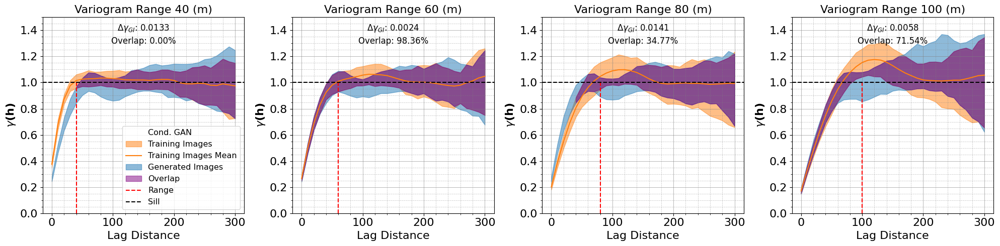

In [60]:
# Initialize list to store results
variogram_results = []
MSE=[]
MSE2=[]
# Epochs to process
Ranges = [40, 60, 80, 100]

# Process data and append results
for i, Range in enumerate(Ranges):
    # Load new data


    new_data_path =  f'VAE GAN DDPM/Training/my_data{Range}_32_32COND.npz'
    new_data = np.load(new_data_path, allow_pickle=True)
    new_images = [new_data[key] for key in new_data]
    combined_new_tensor = np.stack(new_images).squeeze()[:150]
    nlag_new, median_new, iqr_new,Vari1 = calculate_variograms(combined_new_tensor)
    interpolation_function = interp1d(nlag_new, median_new, kind='linear')
    # Load epoch data
    data_path = f'VAE GAN DDPM/GAN/CGAN{Range}.npy'
    data = np.load(data_path, allow_pickle=True)
    
    combined_tensor = data.squeeze()[:150]
    nlag, median_epoch, iqr_epoch,Vari2 = calculate_variograms(combined_tensor)
    
    
    MSE.append(np.mean((interpolation_function(nlag[:i+1])-Vari2[:,:i+1])**2))
    MSE2.append(np.mean((interpolation_function(nlag[:i+1])-Vari1[:,:i+1])**2))

    # Append results
    variogram_results.append({
        'Range': Range,
        'New Data': {'nlag': nlag_new, 'median': (median_new ), 'iqr': (iqr_new)},
        'Epoch Data': {'nlag': nlag, 'median': (median_epoch), 'iqr': (iqr_epoch)}
    })

fig, axs = plt.subplots(1, 4, figsize=(20, 5))
axs = axs.flatten()
Delta_Gamma_CGAN = []
Overlap_Gamma_CGAN=[]

for i, result in enumerate(variogram_results):
    Range = result['Range']
    nlag_new = result['New Data']['nlag']
    median_new = result['New Data']['median']
    iqr_new = result['New Data']['iqr']
    nlag = result['Epoch Data']['nlag']
    median_epoch = result['Epoch Data']['median']
    iqr_epoch = result['Epoch Data']['iqr']
    axs[i].plot([], [], ' ', label='Cond. GAN')

    # Plot IQR and median for new data as reference
    axs[i].fill_between(nlag_new, iqr_new[0, :], iqr_new[1, :], color='C1', alpha=0.5, label='Training Images')
    axs[i].plot(nlag_new, median_new, color='C1',alpha=1, label='Training Images Mean')
    # Plot IQR and median for epoch data
    axs[i].fill_between(nlag, iqr_epoch[0, :], iqr_epoch[1, :], color='C0', alpha=0.5, label='Generated Images')
    lower_bound = np.maximum(iqr_epoch[0, :], iqr_new[0, :])
    upper_bound = np.minimum(iqr_epoch[1, :], iqr_new[1, :])
    overlap = np.where(upper_bound >= lower_bound, True, False)
    axs[i].fill_between(nlag, lower_bound * overlap, upper_bound * overlap, where=overlap, color='purple', alpha=0.5, label='Overlap')
    Oc = abs((lower_bound * overlap-upper_bound * overlap)[:int(Range/10)]).mean()
    Tot = abs((iqr_new[0, :]-iqr_new[1, :])[:int(Range/10)]).mean()
    axs[i].vlines(x=Range,  ymin=0, ymax=1, color='r', linestyle='--', label=f'Range')
    axs[i].axhline(y=1, color='k', linestyle='--', label='Sill')
    axs[i].text(0.5, 0.97, f'$\\Delta \\gamma_{{GI}}$: {MSE[i]:.4f}', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)
    axs[i].text(0.5, 0.90, f'Overlap: {Oc/Tot*100:.2f}%', ha='center', va='top', transform=axs[i].transAxes, fontsize=12)

    axs[i].set_title(f'Variogram Range {Range} (m)', fontsize = 16)
    axs[i].set_xlabel('Lag Distance', fontsize = 16)
    axs[i].set_ylabel(r'$\gamma \bf(h)$', fontsize= 16)
    axs[i].tick_params(axis='both', which='major', labelsize=16)
    axs[i].set_ylim(0, 1.5)  # Adjust this range based on your data

    axs[i].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    Delta_Gamma_CGAN.append(MSE[i])
    Overlap_Gamma_CGAN.append(Oc/Tot*100)
    # Enable the minor ticks
    axs[i].minorticks_on()

    # Modify the existing major grid settings if needed, or keep it as is
    axs[i].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)
    if i ==0:
        axs[i].legend(fontsize = 11.5, loc = 'lower right')

plt.tight_layout()
plt.show()
Original = MSE2

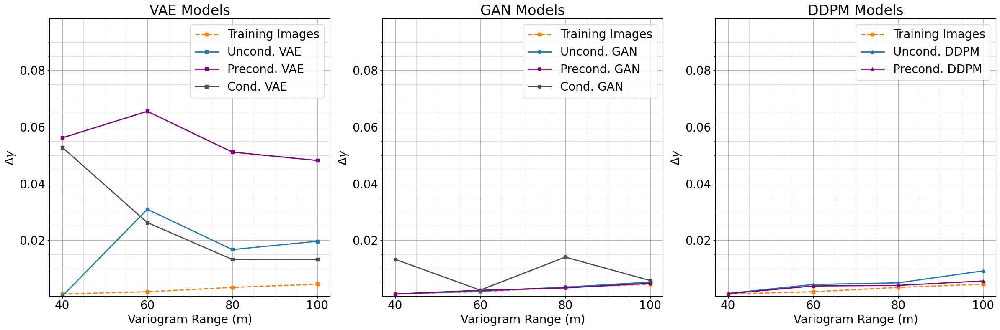

In [61]:
import matplotlib.pyplot as plt

# Data for the x-axis
x_axis = [40, 60, 80, 100]

# Creating subplots for MDS values
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

# Set consistent y-axis limits
y_min = min(min(Delta_Gamma_VAE + Delta_Gamma_VAECOND + Delta_Gamma_CVAE + Delta_Gamma_GAN + Delta_Gamma_GANCOND + Delta_Gamma_CGAN + Delta_Gamma_DDPM + Delta_Gamma_DDPMCOND), 1)
y_max = max(Delta_Gamma_VAE + Delta_Gamma_VAECOND + Delta_Gamma_CVAE + Delta_Gamma_GAN + Delta_Gamma_GANCOND + Delta_Gamma_CGAN + Delta_Gamma_DDPM + Delta_Gamma_DDPMCOND)*1.5
axs[0].plot(x_axis, Original, color='C1', marker='s', linestyle='--', linewidth=2, label='Training Images')

# Subplot 1: VAE Models MDS
axs[0].plot(x_axis, Delta_Gamma_VAE, color='C0', marker='s', linestyle='-', linewidth=2, label='Uncond. VAE')
axs[0].plot(x_axis, Delta_Gamma_VAECOND, color='purple', marker='s', linestyle='-', linewidth=2, label='Precond. VAE')
axs[0].plot(x_axis, Delta_Gamma_CVAE, color='#4D4D4D', marker='s', linestyle='-', linewidth=2, label='Cond. VAE')
axs[1].plot(x_axis, Original, color='C1', marker='s', linestyle='--', linewidth=2, label='Training Images')
axs[2].plot(x_axis, Original, color='C1', marker='s', linestyle='--', linewidth=2, label='Training Images')

axs[0].set_title('VAE Models', fontsize=24)
axs[0].set_xlabel('Variogram Range (m)', fontsize=20)
axs[0].set_ylabel('$\\Delta \\gamma$', fontsize=20)
axs[0].tick_params(axis='both', which='major', labelsize=20)

axs[0].set_ylim([y_min, y_max])
axs[0].legend(fontsize=20, loc='upper right')
axs[0].set_xticks(x_axis)  # Set x-ticks to only 40, 60, 80, 100
axs[0].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[0].minorticks_on()
axs[0].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

# Subplot 2: GAN Models MDS
axs[1].plot(x_axis, Delta_Gamma_GAN, color='C0', marker='o', linestyle='-', linewidth=2, label='Uncond. GAN')
axs[1].plot(x_axis, Delta_Gamma_GANCOND, color='purple', marker='o', linestyle='-', linewidth=2, label='Precond. GAN')
axs[1].plot(x_axis, Delta_Gamma_CGAN, color='#4D4D4D', marker='o', linestyle='-', linewidth=2, label='Cond. GAN')

axs[1].set_title('GAN Models', fontsize=24)
axs[1].set_xlabel('Variogram Range (m)', fontsize=20)
axs[1].set_ylabel('$\\Delta \\gamma$', fontsize=20)
axs[1].tick_params(axis='both', which='major', labelsize=20)

axs[1].set_ylim([y_min, y_max])
axs[1].legend(fontsize=20, loc='upper right')
axs[1].set_xticks(x_axis)  # Set x-ticks to only 40, 60, 80, 100
axs[1].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[1].minorticks_on()
axs[1].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

# Subplot 3: DDPM Models MDS
axs[2].plot(x_axis, Delta_Gamma_DDPM, color='C0', marker='^', linestyle='-', linewidth=2, label='Uncond. DDPM')
axs[2].plot(x_axis, Delta_Gamma_DDPMCOND, color='purple', marker='^', linestyle='-', linewidth=2, label='Precond. DDPM')

axs[2].set_title('DDPM Models', fontsize=24)
axs[2].set_xlabel('Variogram Range (m)', fontsize=20)
axs[2].set_ylabel('$\\Delta \\gamma$', fontsize=20)
axs[2].tick_params(axis='both', which='major', labelsize=20)

axs[2].set_ylim([y_min, y_max])
axs[2].legend(fontsize=20, loc='upper right')
axs[2].set_xticks(x_axis)  # Set x-ticks to only 40, 60, 80, 100
axs[2].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[2].minorticks_on()
axs[2].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

plt.tight_layout()
plt.show()


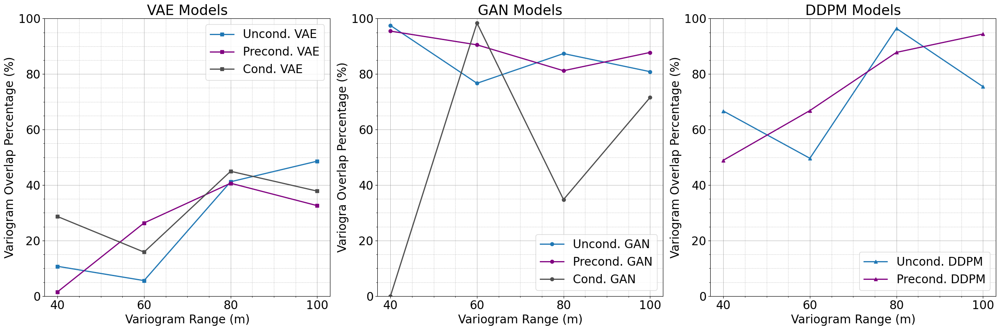

In [62]:
import matplotlib.pyplot as plt

# Data for the x-axis
x_axis = [40, 60, 80, 100]


# Creating subplots for MDS values
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

# Set consistent y-axis limits
y_min = min(min(Overlap_Gamma_VAE + Overlap_Gamma_VAECOND + Overlap_Gamma_CVAE + Overlap_Gamma_GAN + Overlap_Gamma_GANCOND + Overlap_Gamma_CGAN + Overlap_Gamma_DDPM + Overlap_Gamma_DDPMCOND), 1)
y_max = 100

# Subplot 1: VAE Models MDS
axs[0].plot(x_axis, Overlap_Gamma_VAE, color='C0', marker='s', linestyle='-', linewidth=2, label='Uncond. VAE')
axs[0].plot(x_axis, Overlap_Gamma_VAECOND, color='purple', marker='s', linestyle='-', linewidth=2, label='Precond. VAE')
axs[0].plot(x_axis,  Overlap_Gamma_CVAE, color='#4D4D4D', marker='s', linestyle='-', linewidth=2, label='Cond. VAE')

axs[0].set_title('VAE Models', fontsize=24)
axs[0].set_xlabel('Variogram Range (m)', fontsize=20)
axs[0].set_ylabel('Variogram Overlap Percentage (%)', fontsize=20)
axs[0].tick_params(axis='both', which='major', labelsize=20)

axs[0].set_ylim([y_min, y_max])
axs[0].legend(fontsize=20, loc='upper right')
axs[0].set_xticks(x_axis)  # Set x-ticks to only 40, 60, 80, 100
axs[0].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[0].minorticks_on()
axs[0].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

# Subplot 2: GAN Models MDS
axs[1].plot(x_axis, Overlap_Gamma_GAN, color='C0', marker='o', linestyle='-', linewidth=2, label='Uncond. GAN')
axs[1].plot(x_axis, Overlap_Gamma_GANCOND, color='purple', marker='o', linestyle='-', linewidth=2, label='Precond. GAN')
axs[1].plot(x_axis, Overlap_Gamma_CGAN, color='#4D4D4D', marker='o', linestyle='-', linewidth=2, label='Cond. GAN')

axs[1].set_title('GAN Models', fontsize=24)
axs[1].set_xlabel('Variogram Range (m)', fontsize=20)
axs[1].set_ylabel('Variogra Overlap Percentage (%)', fontsize=20)
axs[1].tick_params(axis='both', which='major', labelsize=20)

axs[1].set_ylim([y_min, y_max])
axs[1].legend(fontsize=20, loc='lower right')
axs[1].set_xticks(x_axis)  # Set x-ticks to only 40, 60, 80, 100
axs[1].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[1].minorticks_on()
axs[1].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

# Subplot 3: DDPM Models MDS
axs[2].plot(x_axis, Overlap_Gamma_DDPM, color='C0', marker='^', linestyle='-', linewidth=2, label='Uncond. DDPM')
axs[2].plot(x_axis, Overlap_Gamma_DDPMCOND, color='purple', marker='^', linestyle='-', linewidth=2, label='Precond. DDPM')

axs[2].set_title('DDPM Models', fontsize=24)
axs[2].set_xlabel('Variogram Range (m)', fontsize=20)
axs[2].set_ylabel('Variogram Overlap Percentage (%)', fontsize=20)
axs[2].tick_params(axis='both', which='major', labelsize=20)

axs[2].set_ylim([y_min, y_max])
axs[2].legend(fontsize=20, loc='lower right')
axs[2].set_xticks(x_axis)  # Set x-ticks to only 40, 60, 80, 100
axs[2].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[2].minorticks_on()
axs[2].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

plt.tight_layout()
plt.show()


#### Local Exactitude Check

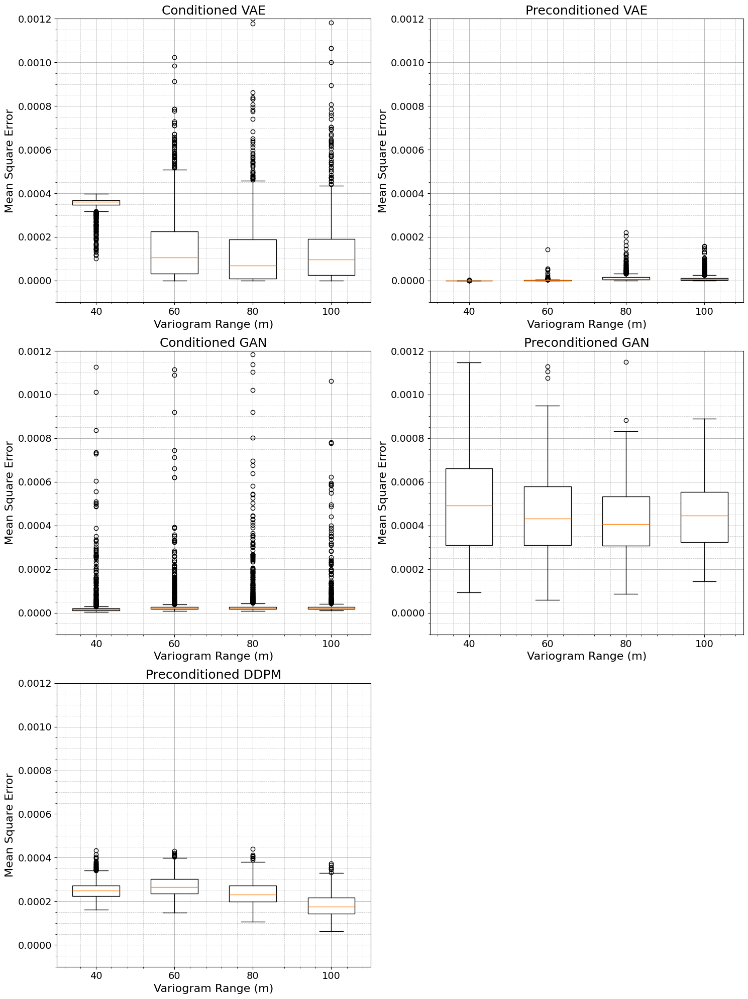

In [64]:

file_numbers = [40, 60, 80, 100]
MSECVAE = []
MSECGAN = []
MSEVAECOND = []
MSEGANCOND = []
MSEDDPMCOND = []
for num in file_numbers:
    # Construct file names based on current number
    data2_filename = f'VAE GAN DDPM/GAN/CGAN{num}.npy'
    data3_filename = f'VAE GAN DDPM/GAN/GAN{num}COND.npz'
    data5_filename = f'VAE GAN DDPM/VAE/VAE{num}COND.npy'
    data6_filename = f'VAE GAN DDPM/VAE/CVAE{num}.npy'
    data7_filename = f'VAE GAN DDPM/DDPM/DDPM{num}COND.npy'
    data9_filename = f'VAE GAN DDPM/Training/my_data{num}_32_32COND.npz'
    def extract_values(data, indices):
        # Creating an empty array to hold the extracted values
        extracted = np.empty((data.shape[0], len(indices)))
        
        for i, idx in enumerate(indices):
            # Extracting the values at the specified index for all images
            extracted[:, i] = data[:, idx[0], idx[1]]
        
        # Reshape to the desired shape (1000, 5, 5) if necessary
        # Here I'm assuming that you meant a 2D array with the second dimension being 5 for clarity
        return extracted.reshape(data.shape[0], 5, 1)

    data9 = np.load(data9_filename)
    images = [data9[key] for key in data9]
    data9 = np.stack(images).squeeze().mean(axis=0)
    data10= np.stack(images).squeeze()

    indices = [(4, 16), (16, 4), (16, 16), (16, 28), (28, 16)]
    indices2 = [(16, 4), (4, 16), (16, 16), (28, 16),(16, 28)]

    values = [data9[idx] for idx in indices]
    
    data2 = np.load(data2_filename)
    data2  = np.rot90(data2, k=3, axes=(1, 2))

# Then, flipping the images horizontally to align indices
    data2 = np.flip(data2 , axis=2)
    data2  = np.flip(data2, axis=0)

    data3 = np.load(data3_filename)
    images = [data3[key] for key in data3]
    data3 = np.stack(images).squeeze()

    data5 = np.load(data5_filename).squeeze()
    data6 = np.load(data6_filename).squeeze()
    data7 = np.load(data7_filename).squeeze()
    data7 = (data7-data7.mean())/data7.std()*data9.std()+data9.mean()

    MSECVAE.append(np.mean((extract_values(data6, indices).squeeze() - values) ** 2,axis=1))
    MSECGAN.append(np.mean((extract_values(data2, indices).squeeze() - values) ** 2,axis=1))
    MSEVAECOND.append(np.mean((extract_values(data5, indices).squeeze() - values) ** 2,axis=1))
    MSEGANCOND.append(np.mean((extract_values(data3, indices).squeeze() - values) ** 2,axis=1))
    MSEDDPMCOND.append(np.mean((extract_values(data7, indices).squeeze() - values) ** 2,axis=1))


# Increasing the size of the box plots directly by adjusting the figure size
fig, axs = plt.subplots(3, 2, figsize=(15, 20))  # Enlarged figure for larger box plots
model_data = [MSECVAE,MSEVAECOND, MSECGAN,  MSEGANCOND, MSEDDPMCOND]

# Assign colors for each box plot for visual distinction
color = 'white'

Titles=['Conditioned VAE','Preconditioned VAE','Conditioned GAN','Preconditioned GAN','Preconditioned DDPM']
i = 0
for ax, data, title in zip(axs.flat, model_data,Titles):
    bplot = ax.boxplot(data, positions=range(len(file_numbers)), widths=0.6, patch_artist=True, notch=False)
    for patch in bplot['boxes']:
        patch.set_facecolor(color)
    ax.set_title(Titles[i], fontsize=18)
    ax.set_xticks(range(len(file_numbers)))
    ax.set_xticklabels(file_numbers, fontsize=14)
    ax.tick_params(axis='y', labelsize=14)

    ax.set_xlabel('Variogram Range (m)', fontsize=16)
    ax.set_ylabel('Mean Square Error', fontsize=16)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    ax.grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    ax.set_ylim(-0.0001,0.0012)
    # Enable the minor ticks
    ax.minorticks_on()

    # Modify the existing major grid settings if needed, or keep it as is
    ax.grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

    i = 1+i


# Removing the unused subplot in the last position
axs[-1, -1].axis('off')

plt.tight_layout()
plt.show()



#### Dynamic Check 

The dynamic response check compares the uncertainty and the values in the recovery factor from TIs and genAI-generated realizations using numerical flow simulation. For each model and variogram range, 100 simulated realizations are calculated. The metric is summarized as a distribution overlap coefficient over time by calculating normalized bins at each time step, then averaging across time. The value of the recovery factor is checked using percentage error between the P50 values of SGSIM-based TIs and genAI-generated realizations flow simulation $\epsilon_{P50}$.

$$
\text{RF} = \frac{N_P}{N} 
$$

where RF is the recovery factor, $N_P$ is the oil volume produced at time $t$, and $N$ is the original oil in place.

$$
C_{RF,\text{overlap}} = \frac{1}{(t_f - t_i)} \sum_{t_i}^{t_f} \text{min}\left(\hat{RF}_{TI,t}, \hat{RF}_{GI,t}\right) \times 100 
$$

where $\hat{RF}_{TI,t}$ and $\hat{RF}_{GI,t}$ are normalized distributions of recovery factors at time $t$ for SGSIM-based TIs and genAI-generated realizations, $t_i$ and $t_f$ are initial and final flow simulation times, respectively. The closer $C_{RF,\text{overlap}}$ is to 100%, the better the uncertainty is reproduced.

$$
\epsilon_{P50} = \frac{RF_{TI,p50} - RF_{GI,p50}}{RF_{TI,p50}} \times 100 
$$

Where $RF_{TI,p50}$ and $RF_{GI,p50}$ are the P50 recovery factors of SGSIM-based TIs and genAI-generated realizations flow simulation evaluated at the end of simulation time $t_f$. The closer $\epsilon_{P50}$ is to 0%, the higher the accuracy.

The flow simulator solves for the diffusivity equation:

$$
\frac{\partial(\phi\rho_\alpha S_\alpha)}{\partial t} + \nabla \cdot (\rho_\alpha v_\alpha) = q_\alpha 
$$

where $\phi$ is porosity, $\rho_\alpha$, $S_\alpha$, and $v_\alpha$ are phase $\alpha$ (oil, water, or gas) density, saturation, and Darcy velocity respectively, and $q_\alpha$ is the production/injection mass rate of phase $\alpha$. Darcy velocity is defined as:

$$
v_\alpha = -\frac{k k_{r\alpha}}{\mu_\alpha} (\nabla p_\alpha - \rho_\alpha g) 
$$

where $k$ is permeability, $k_{r\alpha}$, $\mu_\alpha$, and $p_\alpha$ are relative permeability, viscosity, and pressure of phase $\alpha$, and $g$ is gravity. The resulting recovery factor and its uncertainty are compared visually.

**Figure 1.** The applied five-spot well pattern: one injector (blue) and four producers (red).

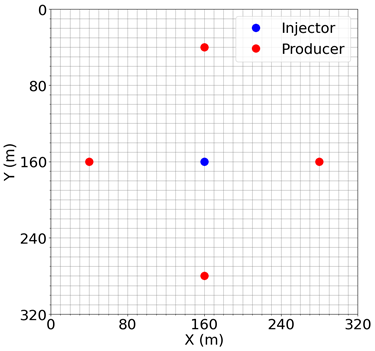


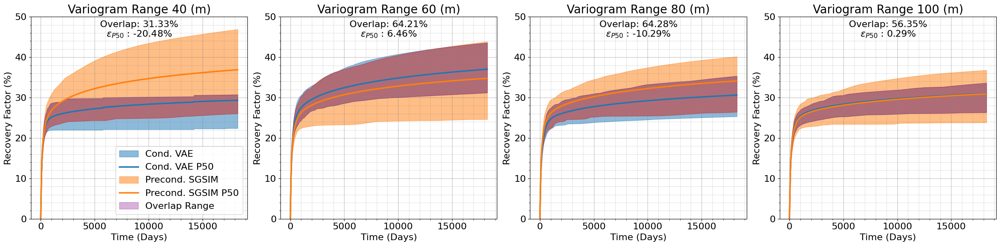

In [42]:
paths = [
    ("Fluid Flow Simulation/Cond. VAE/40C.xlsx", "Fluid Flow Simulation/SGS/40C.xlsx"),
    ("Fluid Flow Simulation/Cond. VAE/60C.xlsx", "Fluid Flow Simulation/SGS/60C.xlsx"),
    ("Fluid Flow Simulation/Cond. VAE/80C.xlsx", "Fluid Flow Simulation/SGS/80C.xlsx"),
    ("Fluid Flow Simulation/Cond. VAE/100C.xlsx", "Fluid Flow Simulation/SGS/100C.xlsx"),
]

CVAE = []
CVAE2 = []
# Create the 1x4 subplot setup remains the same
fig, axs = plt.subplots(1, 4, figsize=(24, 6))
titles = ['Variogram Range 40 (m)', 'Variogram Range 60 (m)', 'Variogram Range 80 (m)', 'Variogram Range 100 (m)']

for i, (ax, (genAI_path, TIs_path), title) in enumerate(zip(axs, paths, titles)):
    grouped_genAI, grouped_TIs = load_and_process_data(genAI_path, TIs_path)
    exclusion_index = 5781.810949
    if exclusion_index in grouped_genAI.index:
        grouped_genAI = grouped_genAI.drop(index=exclusion_index)
    # Plotting with updated percentile areas
    ax.fill_between(grouped_genAI.index, grouped_genAI['percentile_25'], grouped_genAI['percentile_75'], color='C0', alpha=0.5, label='Cond. VAE')
    ax.plot(grouped_genAI.index, grouped_genAI['mean'], color='C0', linewidth=2.5, label='Cond. VAE P50')


    if i==0:
        a,b=grouped_genAI.index,grouped_genAI['mean']
    
    ax.fill_between(grouped_TIs.index, grouped_TIs['percentile_25'], grouped_TIs['percentile_75'], color='C1', alpha=0.5, label='Precond. SGSIM')
    ax.plot(grouped_TIs.index, grouped_TIs['mean'], color='C1', linewidth=2.5, label='Precond. SGSIM P50')
    
    # Adjust overlap calculation for the new percentiles
    overlap_min = np.maximum(grouped_genAI['percentile_25'], grouped_TIs['percentile_25'])
    overlap_max = np.minimum(grouped_genAI['percentile_75'], grouped_TIs['percentile_75'])
    valid_overlap = overlap_min < overlap_max
    ax.fill_between(grouped_genAI.index[valid_overlap], overlap_min[valid_overlap], overlap_max[valid_overlap], color='purple', alpha=0.3, label='Overlap Range')
    
    ax.set_title(title, fontsize=20)
    ax.set_xlabel('Time (Days)', fontsize=16)
    ax.set_ylabel('Recovery Factor (%)', fontsize=16)
    ax.tick_params(axis='both', which='major', labelsize=16)
    ax.grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    
    # Enable the minor ticks
    ax.minorticks_on()
    Oc = (overlap_max[valid_overlap]-overlap_min[valid_overlap]).mean()
    Tot = (grouped_TIs['percentile_75']-grouped_TIs['percentile_25']).mean()
    ax.text(0.5, 0.95, f'Overlap: {(Oc/Tot)*100:.2f}%', transform=ax.transAxes, fontsize=16, ha='center')
    a=grouped_genAI['mean'].values[-1]
    b=grouped_TIs['mean'].values[-1]
    ax.text(0.5, 0.90, f'$\epsilon_{{P50}}$ : {(a-b)/b*100:.2f}%', transform=ax.transAxes, fontsize=16, ha='center')
    CVAE.append((Oc/Tot)*100)
    CVAE2.append(((a-b)/b*100))
    # Modify the existing major grid settings if needed, or keep it as is
    ax.grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

    if i == 0:  # Legend setup remains the same
        ax.legend(loc='best', fontsize=16)
    ax.set_ylim([0, 50])
fig.tight_layout()

plt.show()

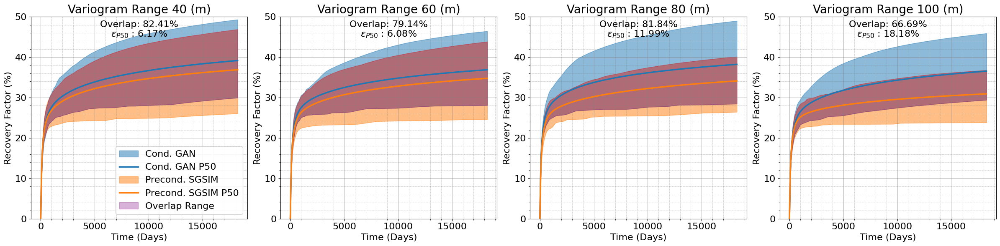

In [39]:
# Paths for the Excel files remain the same
paths = [
    ("Fluid Flow Simulation/Cond. GAN/40C.xlsx", "Fluid Flow Simulation/SGS/40C.xlsx"),
    ("Fluid Flow Simulation/Cond. GAN/60C.xlsx", "Fluid Flow Simulation/SGS/60C.xlsx"),
    ("Fluid Flow Simulation/Cond. GAN/80C.xlsx", "Fluid Flow Simulation/SGS/80C.xlsx"),
    ("Fluid Flow Simulation/Cond. GAN/100C.xlsx", "Fluid Flow Simulation/SGS/100C.xlsx"),
]
CGAN = []
CGAN2 = []

# Create the 1x4 subplot setup remains the same
fig, axs = plt.subplots(1, 4, figsize=(24, 6))
titles = ['Variogram Range 40 (m)', 'Variogram Range 60 (m)', 'Variogram Range 80 (m)', 'Variogram Range 100 (m)']

for i, (ax, (genAI_path, TIs_path), title) in enumerate(zip(axs, paths, titles)):
    grouped_genAI, grouped_TIs = load_and_process_data(genAI_path, TIs_path)
    exclusion_index = 5781.810949
    if exclusion_index in grouped_genAI.index:
        grouped_genAI = grouped_genAI.drop(index=exclusion_index)
    # Plotting with updated percentile areas
    ax.fill_between(grouped_genAI.index, grouped_genAI['percentile_25'], grouped_genAI['percentile_75'], color='C0', alpha=0.5, label='Cond. GAN')
    ax.plot(grouped_genAI.index, grouped_genAI['mean'], color='C0', linewidth=2.5, label='Cond. GAN P50')


    if i==0:
        a,b=grouped_genAI.index,grouped_genAI['mean']
    
    ax.fill_between(grouped_TIs.index, grouped_TIs['percentile_25'], grouped_TIs['percentile_75'], color='C1', alpha=0.5, label='Precond. SGSIM')
    ax.plot(grouped_TIs.index, grouped_TIs['mean'], color='C1', linewidth=2.5, label='Precond. SGSIM P50')
    
    # Adjust overlap calculation for the new percentiles
    overlap_min = np.maximum(grouped_genAI['percentile_25'], grouped_TIs['percentile_25'])
    overlap_max = np.minimum(grouped_genAI['percentile_75'], grouped_TIs['percentile_75'])
    valid_overlap = overlap_min < overlap_max
    ax.fill_between(grouped_genAI.index[valid_overlap], overlap_min[valid_overlap], overlap_max[valid_overlap], color='purple', alpha=0.3, label='Overlap Range')
    
    ax.set_title(title, fontsize=20)
    ax.set_xlabel('Time (Days)', fontsize=16)
    ax.set_ylabel('Recovery Factor (%)', fontsize=16)
    ax.tick_params(axis='both', which='major', labelsize=16)
    ax.grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    Oc = (overlap_max[valid_overlap]-overlap_min[valid_overlap]).mean()
    Tot = (grouped_TIs['percentile_75']-grouped_TIs['percentile_25']).mean()
    ax.text(0.5, 0.95, f'Overlap: {(Oc/Tot)*100:.2f}%', transform=ax.transAxes, fontsize=16, ha='center')
    a=grouped_genAI['mean'].values[-1]
    b=grouped_TIs['mean'].values[-1]
    ax.text(0.5, 0.90, f'$\epsilon_{{P50}}$ : {(a-b)/b*100:.2f}%', transform=ax.transAxes, fontsize=16, ha='center')
    # Enable the minor ticks
    ax.minorticks_on()
    
    CGAN.append((Oc/Tot)*100)
    CGAN2.append(((a-b)/b*100))
    # Modify the existing major grid settings if needed, or keep it as is
    ax.grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

    if i == 0:  # Legend setup remains the same
        ax.legend(loc='best', fontsize=16)
    ax.set_ylim([0, 50])
fig.tight_layout()

plt.show()


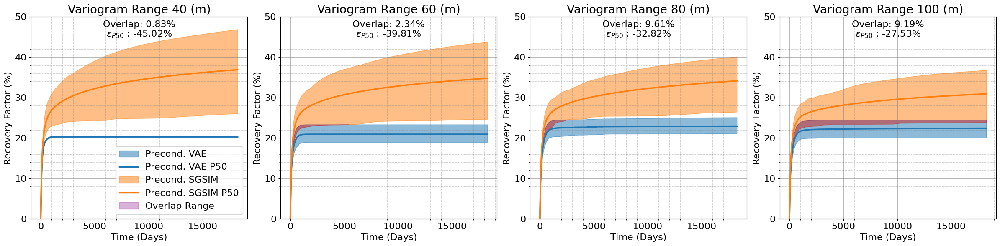

In [38]:
# Paths for the Excel files remain the same
paths = [
    ("Fluid Flow Simulation/Precond. VAE/40C.xlsx", "Fluid Flow Simulation/SGS/40C.xlsx"),
    ("Fluid Flow Simulation/Precond. VAE/60C.xlsx", "Fluid Flow Simulation/SGS/60C.xlsx"),
    ("Fluid Flow Simulation/Precond. VAE/80C.xlsx", "Fluid Flow Simulation/SGS/80C.xlsx"),
    ("Fluid Flow Simulation/Precond. VAE/100C.xlsx", "Fluid Flow Simulation/SGS/100C.xlsx"),
]

VAECOND=[]
VAECOND2=[]


# Create the 1x4 subplot setup remains the same
fig, axs = plt.subplots(1, 4, figsize=(24, 6))
titles = ['Variogram Range 40 (m)', 'Variogram Range 60 (m)', 'Variogram Range 80 (m)', 'Variogram Range 100 (m)']

for i, (ax, (genAI_path, TIs_path), title) in enumerate(zip(axs, paths, titles)):
    grouped_genAI, grouped_TIs = load_and_process_data(genAI_path, TIs_path)
    exclusion_index = 5781.810949
    if exclusion_index in grouped_genAI.index:
        grouped_genAI = grouped_genAI.drop(index=exclusion_index)
    # Plotting with updated percentile areas
    ax.fill_between(grouped_genAI.index, grouped_genAI['percentile_25'], grouped_genAI['percentile_75'], color='C0', alpha=0.5, label='Precond. VAE')
    ax.plot(grouped_genAI.index, grouped_genAI['mean'], color='C0', linewidth=2.5, label='Precond. VAE P50')


    if i==0:
        a,b=grouped_genAI.index,grouped_genAI['mean']
    
    ax.fill_between(grouped_TIs.index, grouped_TIs['percentile_25'], grouped_TIs['percentile_75'], color='C1', alpha=0.5, label='Precond. SGSIM')
    ax.plot(grouped_TIs.index, grouped_TIs['mean'], color='C1', linewidth=2.5, label='Precond. SGSIM P50')
    
    # Adjust overlap calculation for the new percentiles
    overlap_min = np.maximum(grouped_genAI['percentile_25'], grouped_TIs['percentile_25'])
    overlap_max = np.minimum(grouped_genAI['percentile_75'], grouped_TIs['percentile_75'])
    valid_overlap = overlap_min < overlap_max
    ax.fill_between(grouped_genAI.index[valid_overlap], overlap_min[valid_overlap], overlap_max[valid_overlap], color='purple', alpha=0.3, label='Overlap Range')
    Oc = (overlap_max[valid_overlap]-overlap_min[valid_overlap]).mean()
    Tot = (grouped_TIs['percentile_75']-grouped_TIs['percentile_25']).mean()
    ax.text(0.5, 0.95, f'Overlap: {(Oc/Tot)*100:.2f}%', transform=ax.transAxes, fontsize=16, ha='center')
    a=grouped_genAI['mean'].values[-1]
    b=grouped_TIs['mean'].values[-1]
    ax.text(0.5, 0.90, f'$\epsilon_{{P50}}$ : {(a-b)/b*100:.2f}%', transform=ax.transAxes, fontsize=16, ha='center')
    ax.set_title(title, fontsize=20)
    ax.set_xlabel('Time (Days)', fontsize=16)
    ax.set_ylabel('Recovery Factor (%)', fontsize=16)
    ax.tick_params(axis='both', which='major', labelsize=16)
    ax.grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    VAECOND.append((Oc/Tot)*100)
    VAECOND2.append(((a-b)/b*100))
    # Enable the minor ticks
    ax.minorticks_on()
    

    # Modify the existing major grid settings if needed, or keep it as is
    ax.grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

    if i == 0:  # Legend setup remains the same
        ax.legend(loc='best', fontsize=16)
    ax.set_ylim([0, 50])
fig.tight_layout()

plt.show()

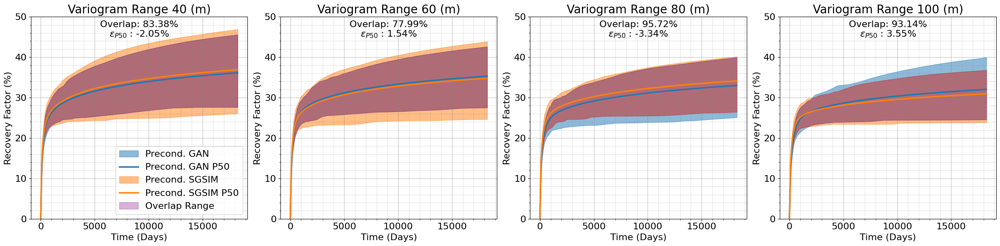

In [37]:

# Paths for the Excel files remain the same
paths = [
    ("Fluid Flow Simulation/Precond. GAN/40GANCOND.xlsx", "Fluid Flow Simulation/SGS/40C.xlsx"),
    ("Fluid Flow Simulation/Precond. GAN/60GANCOND.xlsx", "Fluid Flow Simulation/SGS/60C.xlsx"),
    ("Fluid Flow Simulation/Precond. GAN/80GANCOND.xlsx", "Fluid Flow Simulation/SGS/80C.xlsx"),
    ("Fluid Flow Simulation/Precond. GAN/100GANCOND.xlsx", "Fluid Flow Simulation/SGS/100C.xlsx"),
]

GANCOND=[]
GANCOND2=[]

# Create the 1x4 subplot setup remains the same
fig, axs = plt.subplots(1, 4, figsize=(24, 6))
titles = ['Variogram Range 40 (m)', 'Variogram Range 60 (m)', 'Variogram Range 80 (m)', 'Variogram Range 100 (m)']

for i, (ax, (genAI_path, TIs_path), title) in enumerate(zip(axs, paths, titles)):
    grouped_genAI, grouped_TIs = load_and_process_data(genAI_path, TIs_path)
    exclusion_index = 5781.810949
    if exclusion_index in grouped_genAI.index:
        grouped_genAI = grouped_genAI.drop(index=exclusion_index)
    # Plotting with updated percentile areas
    ax.fill_between(grouped_genAI.index, grouped_genAI['percentile_25'], grouped_genAI['percentile_75'], color='C0', alpha=0.5, label='Precond. GAN')
    ax.plot(grouped_genAI.index, grouped_genAI['mean'], color='C0', linewidth=2.5, label='Precond. GAN P50')


    if i==0:
        a,b=grouped_genAI.index,grouped_genAI['mean']
    
    ax.fill_between(grouped_TIs.index, grouped_TIs['percentile_25'], grouped_TIs['percentile_75'], color='C1', alpha=0.5, label='Precond. SGSIM')
    ax.plot(grouped_TIs.index, grouped_TIs['mean'], color='C1', linewidth=2.5, label='Precond. SGSIM P50')
    
    # Adjust overlap calculation for the new percentiles
    overlap_min = np.maximum(grouped_genAI['percentile_25'], grouped_TIs['percentile_25'])
    overlap_max = np.minimum(grouped_genAI['percentile_75'], grouped_TIs['percentile_75'])
    valid_overlap = overlap_min < overlap_max
    ax.fill_between(grouped_genAI.index[valid_overlap], overlap_min[valid_overlap], overlap_max[valid_overlap], color='purple', alpha=0.3, label='Overlap Range')
    Oc = (overlap_max[valid_overlap]-overlap_min[valid_overlap]).mean()
    Tot = (grouped_TIs['percentile_75']-grouped_TIs['percentile_25']).mean()
    ax.text(0.5, 0.95, f'Overlap: {(Oc/Tot)*100:.2f}%', transform=ax.transAxes, fontsize=16, ha='center')
    a=grouped_genAI['mean'].values[-1]
    b=grouped_TIs['mean'].values[-1]
    ax.text(0.5, 0.90, f'$\epsilon_{{P50}}$ : {(a-b)/b*100:.2f}%', transform=ax.transAxes, fontsize=16, ha='center')

    ax.set_title(title, fontsize=20)
    ax.set_xlabel('Time (Days)', fontsize=16)
    ax.set_ylabel('Recovery Factor (%)', fontsize=16)
    ax.tick_params(axis='both', which='major', labelsize=16)
    ax.grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    GANCOND.append((Oc/Tot)*100)
    GANCOND2.append(((a-b)/b*100))
    # Enable the minor ticks
    ax.minorticks_on()
    

    # Modify the existing major grid settings if needed, or keep it as is
    ax.grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

    if i == 0:  # Legend setup remains the same
        ax.legend(loc='best', fontsize=16)
    ax.set_ylim([0, 50])
fig.tight_layout()

plt.show()

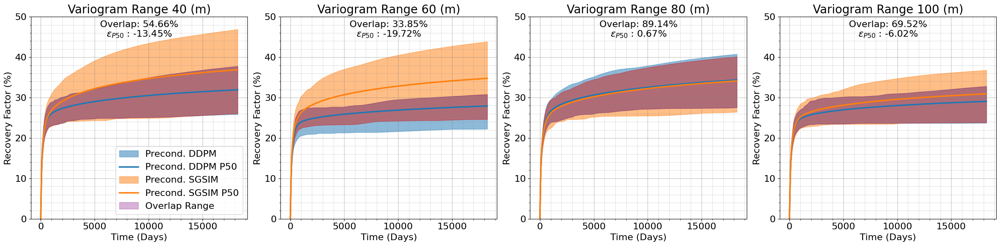

In [44]:
# Paths for the Excel files remain the same
paths = [
    ("Fluid Flow Simulation/Precond. DDPM/40C.xlsx", "Fluid Flow Simulation/SGS/40C.xlsx"),
    ("Fluid Flow Simulation/Precond. DDPM/60C.xlsx", "Fluid Flow Simulation/SGS/60C.xlsx"),
    ("Fluid Flow Simulation/Precond. DDPM/80C.xlsx", "Fluid Flow Simulation/SGS/80C.xlsx"),
    ("Fluid Flow Simulation/Precond. DDPM/100C.xlsx", "Fluid Flow Simulation/SGS/100C.xlsx"),
]

DDPMCOND = []
DDPMCOND2 =[]
# Create the 1x4 subplot setup remains the same
fig, axs = plt.subplots(1, 4, figsize=(24, 6))
titles = ['Variogram Range 40 (m)', 'Variogram Range 60 (m)', 'Variogram Range 80 (m)', 'Variogram Range 100 (m)']

for i, (ax, (GenAI_path, TIs_path), title) in enumerate(zip(axs, paths, titles)):
    grouped_genAI, grouped_TIs = load_and_process_data(GenAI_path, TIs_path)
    exclusion_index = 5781.810949
    if exclusion_index in grouped_genAI.index:
        grouped_genAI = grouped_genAI.drop(index=exclusion_index)
    # Plotting with updated percentile areas
    ax.fill_between(grouped_genAI.index, grouped_genAI['percentile_25'], grouped_genAI['percentile_75'], color='C0', alpha=0.5, label='Precond. DDPM')
    ax.plot(grouped_genAI.index, grouped_genAI['mean'], color='C0', linewidth=2.5, label='Precond. DDPM P50')


    if i==0:
        a,b=grouped_genAI.index,grouped_genAI['mean']
    
    ax.fill_between(grouped_TIs.index, grouped_TIs['percentile_25'], grouped_TIs['percentile_75'], color='C1', alpha=0.5, label='Precond. SGSIM')
    ax.plot(grouped_TIs.index, grouped_TIs['mean'], color='C1', linewidth=2.5, label='Precond. SGSIM P50')
    
    # Adjust overlap calculation for the new percentiles
    overlap_min = np.maximum(grouped_genAI['percentile_25'], grouped_TIs['percentile_25'])
    overlap_max = np.minimum(grouped_genAI['percentile_75'], grouped_TIs['percentile_75'])
    valid_overlap = overlap_min < overlap_max
    ax.fill_between(grouped_genAI.index[valid_overlap], overlap_min[valid_overlap], overlap_max[valid_overlap], color='purple', alpha=0.3, label='Overlap Range')
    Oc = (overlap_max[valid_overlap]-overlap_min[valid_overlap]).mean()
    Tot = (grouped_TIs['percentile_75']-grouped_TIs['percentile_25']).mean()

    ax.set_title(title, fontsize=20)
    ax.set_xlabel('Time (Days)', fontsize=16)
    ax.set_ylabel('Recovery Factor (%)', fontsize=16)
    ax.tick_params(axis='both', which='major', labelsize=16)
    ax.grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    ax.text(0.5, 0.95, f'Overlap: {(Oc/Tot)*100:.2f}%', transform=ax.transAxes, fontsize=16, ha='center')
    a=grouped_genAI['mean'].values[-1]
    b=grouped_TIs['mean'].values[-1]
    ax.text(0.5, 0.90, f'$\epsilon_{{P50}}$ : {(a-b)/b*100:.2f}%', transform=ax.transAxes, fontsize=16, ha='center')
    DDPMCOND.append((Oc/Tot)*100)
    DDPMCOND2.append(((a-b)/b*100))
    # Enable the minor ticks
    ax.minorticks_on()
    

    # Modify the existing major grid settings if needed, or keep it as is
    ax.grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

    if i == 0:  # Legend setup remains the same
        ax.legend(loc='best', fontsize=16)
    ax.set_ylim([0, 50])
fig.tight_layout()

plt.show()

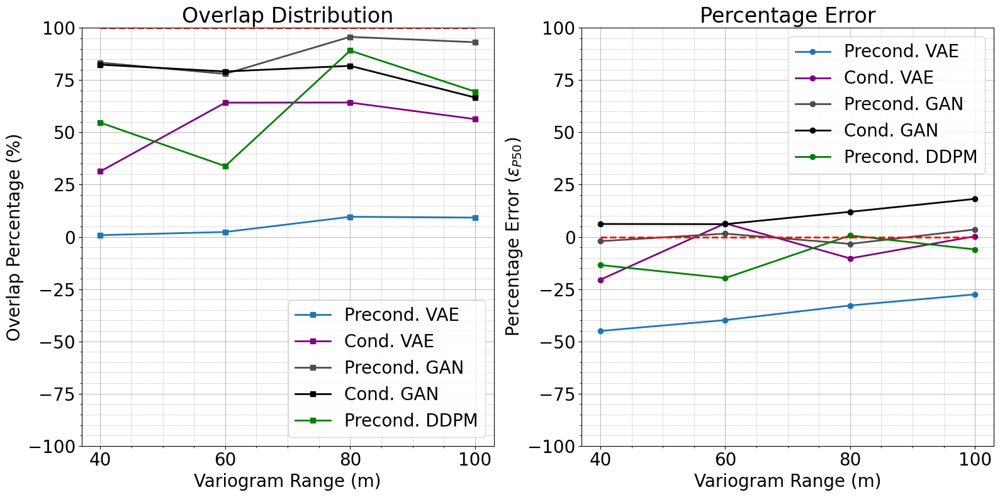

In [43]:
import matplotlib.pyplot as plt

# Data for the x-axis
x_axis = [40, 60, 80, 100]


fig, axs = plt.subplots(1, 2, figsize=(16, 8))


axs[0].plot(x_axis, VAECOND, color='C0', marker='s', linestyle='-', linewidth=2, label='Precond. VAE')
axs[0].plot(x_axis, CVAE, color='purple', marker='s', linestyle='-', linewidth=2, label='Cond. VAE')
axs[0].plot(x_axis, GANCOND, color='#4D4D4D', marker='s', linestyle='-', linewidth=2, label='Precond. GAN')
axs[0].plot(x_axis, CGAN, color='k', marker='s', linestyle='-', linewidth=2, label='Cond. GAN')
axs[0].plot(x_axis, DDPMCOND, color='green', marker='s', linestyle='-', linewidth=2, label='Precond. DDPM')

axs[0].set_title('Overlap Distribution', fontsize=24)
axs[0].set_xlabel('Variogram Range (m)', fontsize=20)
axs[0].set_ylabel('Overlap Percentage (%)', fontsize=20)
axs[0].tick_params(axis='both', which='major', labelsize=20)
axs[0].set_ylim([-100, 100])
axs[0].legend(fontsize=20, loc='lower right')
axs[0].hlines(100, 40, 100, color='red', linestyle='--', linewidth=2)

axs[0].set_xticks(x_axis) 
axs[0].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[0].minorticks_on()
axs[0].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)

axs[1].plot(x_axis, VAECOND2 , color='C0', marker='o', linestyle='-', linewidth=2, label='Precond. VAE')
axs[1].plot(x_axis, CVAE2, color='purple', marker='o', linestyle='-', linewidth=2, label='Cond. VAE')
axs[1].plot(x_axis, GANCOND2, color='#4D4D4D', marker='o', linestyle='-', linewidth=2, label='Precond. GAN')
axs[1].plot(x_axis, CGAN2, color='k', marker='o', linestyle='-', linewidth=2, label='Cond. GAN')
axs[1].plot(x_axis, DDPMCOND2, color='green', marker='o', linestyle='-', linewidth=2, label='Precond. DDPM')
axs[1].hlines(0, 40, 100, color='red', linestyle='--', linewidth=2)


axs[1].set_title('Percentage Error', fontsize=24)
axs[1].set_xlabel('Variogram Range (m)', fontsize=20)
axs[1].set_ylabel('Percentage Error ($\epsilon_{{P50}}$)', fontsize=20)
axs[1].tick_params(axis='both', which='major', labelsize=20)
axs[1].set_ylim([-100, 100])
axs[1].legend(fontsize=20, loc='upper right')
axs[1].set_xticks(x_axis) 
axs[1].grid(True, which='minor', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
axs[1].minorticks_on()
axs[1].grid(True, which='major', color='gray', linestyle='-', linewidth=0.5, alpha=0.8)


plt.tight_layout()
plt.show()


Overall, genAI models for subsurface modeling have some inherent limitations when checked against minimum acceptance checks. VAEs can produce erroneous estimations, negatively impacting decision-making processes in subsurface modeling. VAEs perform poorly in terms of global univariate distribution, local uncertainty model, global uncertainty model, global spatial continuity, and dynamic response. Unconditional and preconditioned GANs demonstrate the best performance among these models. Preconditioned GANs, however, exhibit minor struggles in accurately reproducing local data exactitude despite passing most of the proposed checks. Conditioned GANs face challenges with global uncertainty, global spatial continuity, and dynamic response. Unconditional and preconditional DDPMs have higher variability. Preconditioned DDPMs need to be applied with caution in regard to local data exactitude and dynamic response.

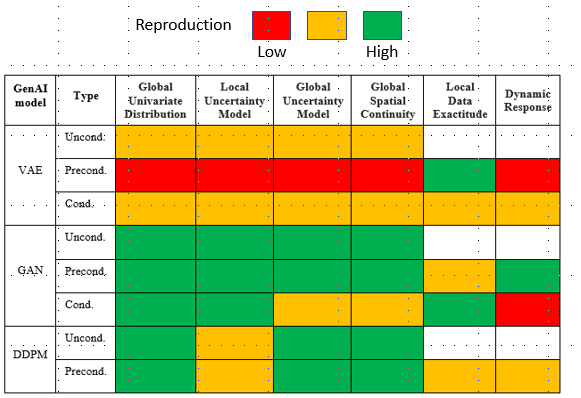

### Conclusion 


The construction of subsurface models using unconditioned and preconditioned VAEs, GANs, and DDPMs, in addition to conditioned VAEs and GANs, is demonstrated. A suite of statistical checks is proposed and applied to evaluate model performance comprehensively. These checks include:

- **Global Univariate Distribution:** Evaluated by histogram reproduction using the overlap coefficient and Q-Q plot divergence area.
- **Local and Global Uncertainty Models:** Assessed using expected by-pixel standard deviation and image comparison in multidimensional scaling (MDS) space with the overlap coefficient.
- **Spatial Continuity:** Checked by reproducing variograms and measuring the dispersion ratio.
- **Local Data Exactitude:** Calculated by assessing conditioning error at measured data locations.
- **Dynamic Response:** Evaluated by running flow simulations for various spatial continuity ranges.

We highlight several limitations in the application of genAI for constructing subsurface models, as illustrated in Table 1. It is essential to apply these checks before utilizing the models because differences in results can lead to poor decision-making. GANs have outperformed VAEs and DDPMs in generating subsurface models with continuous attributes. Using VAEs for subsurface models can result in very low recovery factors, leading to underestimating return on investment.

The developed minimum acceptance criteria protocol only applies to continuous variables, and the model was compared to SGSIM-based TIs, which limited the generalization of the comparison. Another limitation is that only basic architectures were used for the models. Other variants of genAI models can perform better against the proposed metrics. Future work involves incorporating some of these checks into the loss function to improve the reproduction of training images.

